# Assignment 1
Student Names

1. Sharanya Nallapeddi, snallape, 50593866

2. Anchal Daga, anchalda, 50609480


# Part I: From VGG to ResNet [30 pts]
Implement and compare VGG-16 (Version C) and ResNet-18 for image classification. Explore advanced techniques to improve model performance and the transition from standard deep CNNs to networks with residual connections.
The expected accuracy is above 75% for the base model and 80% for the improved model.

Useful Links:
1. https://cv-tricks.com/cnn/understand-resnet-alexnet-vgg-inception/
2. https://www.quora.com/What-is-the-difference-between-using-VGG-or-ResNet-for-transfer-learning-in-CNN-models
3. https://medium.com/@sohaib.zafar522/choosing-the-right-pre-trained-model-a-guide-to-vggnet-resnet-googlenet-alexnet-and-inception-db7a8c918510

## Step 1: Data preparation

1. Load CNN dataset.
Note: Throughout the Assignment, we would be using PyTorch.

1. The CNN Dataset is an organized collection of photos classified into several classes, such as "dogs," "food," and "vehicles,”.
2. A dataset containing 30,000 images (10,000 images per class) of dogs, cars, and food.
Each image is 64x64 pixels.
3. ⁠A varied collection of visual data is provided by the several photographs in each category, which vary in lighting, perspectives, backdrops, and object appearances.
4. This dataset is ideal for supervised learning, in which the model gains the ability to identify class-specific patterns and characteristics. Because the photos are kept in distinct files according to their labels, preprocessing and data loading for deep learning frameworks such as TensorFlow and PyTorch are made simple.
5. ⁠This dataset can be used for applications like feature extraction, transfer learning, and object identification.

In [ ]:
!ls -lh /content/cnn_dataset.zip
!file /content/cnn_dataset.zip
!unzip -l /content/cnn_dataset.zip

Streaming output truncated to the last 5000 lines.
     4388  2023-03-18 21:08   vehicles/550.jpg
     2167  2023-03-18 21:08   vehicles/5500.jpg
     4264  2023-03-18 21:08   vehicles/5501.jpg
     3595  2023-03-18 21:08   vehicles/5502.jpg
     4125  2023-03-18 21:08   vehicles/5503.jpg
     3365  2023-03-18 21:08   vehicles/5504.jpg
     3280  2023-03-18 21:08   vehicles/5505.jpg
     2751  2023-03-18 21:08   vehicles/5506.jpg
     3969  2023-03-18 21:08   vehicles/5507.jpg
     3638  2023-03-18 21:08   vehicles/5508.jpg
     3893  2023-03-18 21:08   vehicles/5509.jpg
     4425  2023-03-18 21:08   vehicles/551.jpg
     3578  2023-03-18 21:08   vehicles/5510.jpg
     3522  2023-03-18 21:08   vehicles/5511.jpg
     3680  2023-03-18 21:08   vehicles/5512.jpg
     3714  2023-03-18 21:08   vehicles/5513.jpg
     3786  2023-03-18 21:08   vehicles/5514.jpg
     3404  2023-03-18 21:08   vehicles/5515.jpg
     3158  2023-03-18 21:08   vehicles/5516.jpg
     3657  2023-03-18 21:08   vehicles/

In [ ]:
!pip uninstall -y torch torchvision torchaudio

Found existing installation: torch 2.6.0+cu118
Uninstalling torch-2.6.0+cu118:
  Successfully uninstalled torch-2.6.0+cu118
Found existing installation: torchvision 0.21.0+cu118
Uninstalling torchvision-0.21.0+cu118:
  Successfully uninstalled torchvision-0.21.0+cu118
Found existing installation: torchaudio 2.6.0+cu118
Uninstalling torchaudio-2.6.0+cu118:
  Successfully uninstalled torchaudio-2.6.0+cu118


In [ ]:
!pip install --upgrade --quiet --force-reinstall \
    torch torchvision torchaudio \
    --index-url https://download.pytorch.org/whl/cu118

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.6.1 which is incompatible.
gensim 4.3.3 requires numpy<2.0,>=1.18.5, but you have numpy 2.1.2 which is incompatible.
langchain 0.3.19 requires numpy<2,>=1.26.4; python_version < "3.12", but you have numpy 2.1.2 which is incompatible.
fastai 2.7.18 requires torch<2.6,>=1.10, but you have torch 2.6.0+cu118 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.1.2 which is incompatible.
pytensor 2.27.1 requires filelock>=3.15, but you have filelock 3.13.1 which is incompatible.
pytensor 2.27.1 requires numpy<2,>=1.17.0, but you have numpy 2.1.2 which is incompatible.
thinc 8.2.5 requires numpy<2.0.0,>=1.19.0; python_version >= "3.9", but you have numpy 2.1.2 which is incompatible.


In [ ]:
import torch
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA available:", torch.cuda.is_available())

PyTorch version: 2.6.0+cu118
Torchvision version: 0.21.0+cu118
CUDA available: True


In [ ]:
import os
import zipfile
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

zip = "/content/cnn_dataset.zip"

extract_dir = "/content/cnn_dataset"

!rm -rf "$extract_dir"
os.makedirs(extract_dir, exist_ok=True)

if not os.path.exists(zip):
    raise FileNotFoundError(f"Zip file not found: {zip}")
print(f"Unzipping {zip} to {extract_dir}...")
with zipfile.ZipFile(zip, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print("\nListing extracted files/folders:")
!ls -R "$extract_dir"  # For debugging - shows the folder structure

cnn_folder_candidate = os.path.join(extract_dir, "cnn_dataset")
if os.path.exists(cnn_folder_candidate) and any(os.scandir(cnn_folder_candidate)):
    CNNFolder = cnn_folder_candidate
    print(f"\nFound subfolder 'cnn_dataset' inside. Using: {CNNFolder}")
else:
    CNNFolder = extract_dir
    print(f"\nNo separate 'cnn_dataset' folder found. Using: {CNNFolder}")

initialTransforms = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

print("\nCreating ImageFolder with root:", CNNFolder)
cnn_dataset = datasets.ImageFolder(root=CNNFolder, transform=initialTransforms)

batch_size = 32
cnn_dataloader = DataLoader(cnn_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

print(f"\nLoaded dataset with {len(cnn_dataset)} images.")
print(f"Classes found: {cnn_dataset.classes}")

Unzipping /content/cnn_dataset.zip to /content/cnn_dataset...

Listing extracted files/folders:
/content/cnn_dataset:
dogs  food  vehicles

/content/cnn_dataset/dogs:
10000.jpg  1900.jpg  2800.jpg  3700.jpg  4600.jpg  5500.jpg  6400.jpg  7300.jpg  8200.jpg  9100.jpg
1000.jpg   1901.jpg  2801.jpg  3701.jpg  4601.jpg  5501.jpg  6401.jpg  7301.jpg  8201.jpg  9101.jpg
1001.jpg   1902.jpg  2802.jpg  3702.jpg  4602.jpg  5502.jpg  6402.jpg  7302.jpg  8202.jpg  9102.jpg
1002.jpg   1903.jpg  2803.jpg  3703.jpg  4603.jpg  5503.jpg  6403.jpg  7303.jpg  8203.jpg  9103.jpg
1003.jpg   1904.jpg  2804.jpg  3704.jpg  4604.jpg  5504.jpg  6404.jpg  7304.jpg  8204.jpg  9104.jpg
1004.jpg   1905.jpg  2805.jpg  3705.jpg  4605.jpg  5505.jpg  6405.jpg  7305.jpg  8205.jpg  9105.jpg
1005.jpg   1906.jpg  2806.jpg  3706.jpg  4606.jpg  5506.jpg  6406.jpg  7306.jpg  8206.jpg  9106.jpg
1006.jpg   1907.jpg  2807.jpg  3707.jpg  4607.jpg  5507.jpg  6407.jpg  7307.jpg  8207.jpg  9107.jpg
1007.jpg   1908.jpg  2808.jpg  37

In [ ]:
!nvidia-smi

Mon Feb 24 21:41:34 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   44C    P8             12W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

Analyze the dataset.

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plot
from collections import Counter

allImages = len(cnn_dataset)
classNos = len(cnn_dataset.classes)
nameOfClasses = cnn_dataset.classes
countsOfClass = Counter([label for _, label in cnn_dataset.samples])

print("\nStatistics of the Dataset")
print(f"Total images in dataset: {allImages}")
print(f"Number of classes: {classNos}")
print(f"Classes: {nameOfClasses}")

for class_idx, count in countsOfClass.items():
    print(f"Class: {nameOfClasses[class_idx]} → {count} images")

sample_img, sample_label = cnn_dataset[0]
print(f"\nImage Shape (C, H, W): {sample_img.shape}")

loader = torch.utils.data.DataLoader(cnn_dataset, batch_size=500, shuffle=False)

def meanAndStandardDev(loader):
    mean = torch.zeros(3)
    std = torch.zeros(3)
    num_samples = 0

    for images, _ in loader:
        batch_samples = images.size(0)
        images = images.view(batch_samples, 3, -1)
        mean += images.mean(dim=[0, 2]) * batch_samples
        std += images.std(dim=[0, 2]) * batch_samples
        num_samples += batch_samples

    mean /= num_samples
    std /= num_samples
    return mean, std

mean, std = meanAndStandardDev(loader)
print(f"\nMean pixel values per channel (RGB): {mean.tolist()}")
print(f"Standard deviation per channel (RGB): {std.tolist()}")


Statistics of the Dataset
Total images in dataset: 30000
Number of classes: 3
Classes: ['dogs', 'food', 'vehicles']
Class: dogs → 10000 images
Class: food → 10000 images
Class: vehicles → 10000 images

Image Shape (C, H, W): torch.Size([3, 64, 64])

Mean pixel values per channel (RGB): [0.08615079522132874, -0.026267163455486298, -0.09742090851068497]
Standard deviation per channel (RGB): [1.1679596900939941, 1.182910680770874, 1.2093493938446045]


About the Statistical Data:

1. Dataset: The dataset consists of 30,000 images, which are evenly distributed across the three classes of dogs, food and vehicles, which each having 10000 images.

2. The image shape has been pre-processed properly and is not uniform across the entire dataset

3. Mean Pixel values per channel: the mean values indicate intensity of each channel across the dataset. The presence of negative values suggests that the data has been normalized.

4. Standard deviation per channel: This shows the pixel intensity per channel. The higher values suggest that images have a wide range of colours and intensity range.

2.	Creating three different visualizations to explore the dataset.

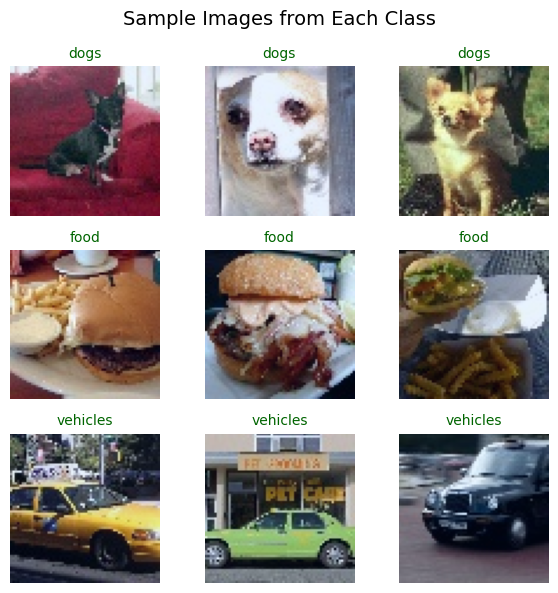

In [ ]:
#Visualisation 1

#Display a grid of sample images from each class (e.g., a 3x3 grid showing 3 dogs, 3 cars, and 3 food items

import matplotlib.pyplot as plot
import numpy as np

def showImages(dataset, num_images=3):
    fig, axes = plot.subplots(classNos, num_images, figsize=(num_images * 2, classNos * 2))

    countOfClass = {class_name: 0 for class_name in nameOfClasses}

    for img, label in dataset:
        class_name = nameOfClasses[label]
        if countOfClass[class_name] < num_images:
            row = label
            col = countOfClass[class_name]
            ax = axes[row, col] if num_images > 1 else axes[row]
            img = img.permute(1, 2, 0).numpy()
            img = (img - img.min()) / (img.max() - img.min())
            ax.imshow(img)
            ax.set_title(f"{class_name}", fontsize=10, color='darkgreen')
            ax.axis("off")
            countOfClass[class_name] += 1

        if all(count >= num_images for count in countOfClass.values()):
            break

    plot.suptitle("Sample Images from Each Class", fontsize=14)
    plot.tight_layout()
    plot.show()

showImages(cnn_dataset)

The plot in this visualization choses three images from the dataset, each from a category. The three images are displayed such that each row defines a distinct class. This helps in understanding the diversity of the dataset and confirming the correctness of the image label prior to model training.

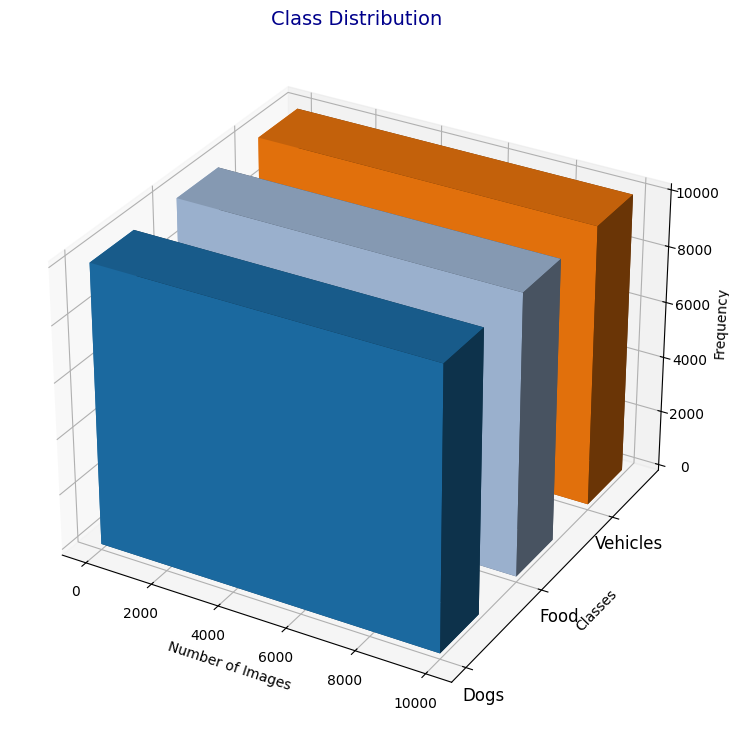

In [ ]:
#Visualisation 2

#Bar chart showing the number of images per class

import matplotlib.pyplot as plot
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

def classDistribution3D(countOfClass):
    fig = plot.figure(figsize=(10, 9))
    ax = fig.add_subplot(111, projection='3d')
    nameOfClasses = list(countOfClass.keys())
    countOfClass = list(countOfClass.values())
    y_pos = np.arange(len(nameOfClasses))

    colors = ["#1f77b4", "#aec7e8", "#ff7f0e"]
    z_values = np.zeros(len(nameOfClasses))

    ax.bar3d(z_values, y_pos, z_values, countOfClass, 0.5, countOfClass, color=colors, shade=True)

    ax.set_xlabel("Number of Images", fontsize=10)
    ax.set_ylabel("Classes", fontsize=10)
    ax.set_zlabel("Frequency", fontsize=10)
    ax.set_yticks(y_pos)
    ax.set_yticklabels(nameOfClasses, fontsize=12)

    ax.set_title("Class Distribution", fontsize=14, color="darkblue")

    plot.show()

countOfClass = {"Dogs": 10000, "Food": 10000, "Vehicles": 10000}

classDistribution3D(countOfClass)

The plot in this visualization displays the number of images per class. There are three classes: Dogs, Food and Vehicles. Each class contains 10,000 images. This chart allows us to see that the image distribution across all three classes is equal and balanced in representation.

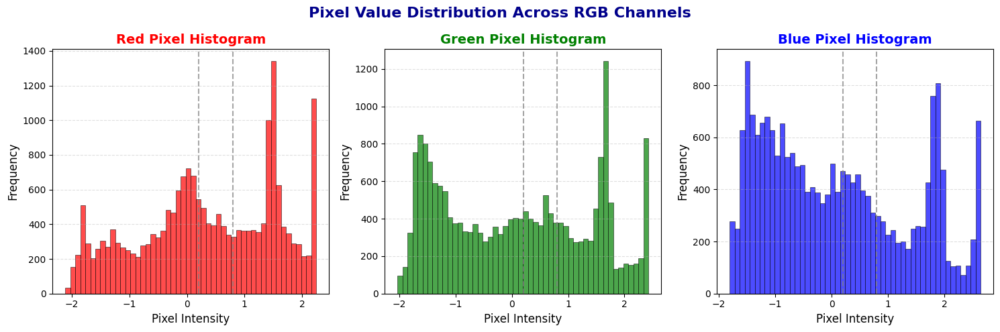

In [ ]:
#Visualisation 3

# Histogram of pixel values for a single channel of a few sample images.
#This helps understand the data's distribution and choose appropriate normalization.

import numpy as np

def pixelHistograms(dataset, num_samples=5):
    fig, axes = plot.subplots(1, 3, figsize=(15, 5))
    colors = ['red', 'green', 'blue']
    titles = ['Red Pixel Histogram', 'Green Pixel Histogram', 'Blue Pixel Histogram']

    sample_images = []
    for i in range(num_samples):
        img_tensor, _ = dataset[i]
        img_np = img_tensor.numpy().transpose(1, 2, 0)
        sample_images.append(img_np)

    for i, color in enumerate(colors):
        pixels = []
        for img in sample_images:
            img_channel = img[:, :, i].flatten()
            pixels.extend(img_channel)

        axes[i].hist(pixels, bins=50, color=color, alpha=0.7, edgecolor="black", linewidth=0.5)
        axes[i].set_title(f"{titles[i]}", fontsize=14, fontweight="bold", color=color)
        axes[i].set_xlabel("Pixel Intensity", fontsize=12)
        axes[i].set_ylabel("Frequency", fontsize=12)
        axes[i].grid(axis='y', linestyle='dashed', alpha=0.4)

        axes[i].axvline(x=0.2, color='gray', linestyle='dashed', alpha=0.7)
        axes[i].axvline(x=0.8, color='gray', linestyle='dashed', alpha=0.7)

    plot.suptitle("Pixel Value Distribution Across RGB Channels", fontsize=16, fontweight="bold", color="darkblue")
    plot.tight_layout()
    plot.show()

pixelHistograms(cnn_dataset)

This visualization shows three histograms representing the overall pixel distribution across the RGB channels. It randomly chosen images from the dataset and analyses the colour density across the images, without taking the classes into account. The histograms display the frequency of the pixel intensity values for images selected. Understanding the intensities across each colour channels allows us to determine if normalization is required before further processing. The vertical dashed lines represent normalization thresholds.

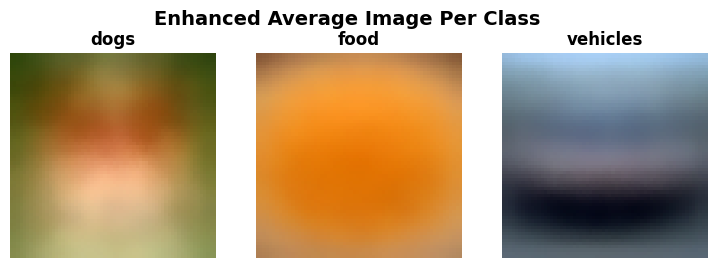

In [ ]:
#Calculate and display the "average" image for each class. This can reveal common features.
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plot

def averageImage(dataset, class_label):

    classImages = [img.numpy() for img, label in dataset if label == class_label]
    avg_img = np.median(np.stack(classImages), axis=0)
    avg_img = (avg_img - avg_img.min()) / (avg_img.max() - avg_img.min())

    return avg_img

def enhanceImage(img):

    img = (img * 255).astype(np.uint8)
    img = cv2.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)
    gaussian = cv2.GaussianBlur(img, (9,9), 10.0)
    sharpened = cv2.addWeighted(img, 1.5, gaussian, -0.5, 0)

    return sharpened

def averageImageFunction(dataset, nameOfClasses):
    fig, axes = plot.subplots(1, len(nameOfClasses), figsize=(len(nameOfClasses) * 3, 3))

    for i, class_name in enumerate(nameOfClasses):
        avg_img = averageImage(dataset, i)
        avg_img = np.transpose(avg_img, (1, 2, 0))
        avg_img = enhanceImage(avg_img)

        axes[i].imshow(avg_img, cmap="gray")
        axes[i].set_title(f"{class_name}", fontsize=12, fontweight="bold")
        axes[i].axis("off")

    plot.suptitle("Enhanced Average Image Per Class", fontsize=14, fontweight="bold")
    plot.show()

averageImageFunction(cnn_dataset, ["dogs", "food", "vehicles"])

The class mean image is the mean pixel intensity across all the images of the said class. It is approximated by taking the average of the pixel value channel-wise (RGB) across all the images of the target class. What one obtains as output is a single representative image that visually accentuates the most prominent features of the class and eliminates the noise and variabilities.

For instance, in a dataset of images of dogs, food, and cars, the average image of:
1. Dogs may feature an indistinct outline of a dog in the middle.
2. The food can also appear as a uniform blend of assorted food textures and colors.
3. Vehicles could display a faded structure of a car-like shape.

Reference:
1. https://www.youtube.com/watch?v=XfoYk_Z5AkI&ab_channel=JeremyHoward
2. https://www.geeksforgeeks.org/how-many-images-per-class-are-sufficient-for-training-a-cnn/#

3. Preprocess the dataset.

In [ ]:
import torch
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, WeightedRandomSampler
import numpy as np

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

cnn_dataset = datasets.ImageFolder(root=CNNFolder, transform=transform)

# 1. Normalize pixel values to [0,1]
# Already handled in transform: transforms.Normalize(): In earlier steps.

# 2. Handling Class Imbalance
countOfClass = np.bincount([label for _, label in cnn_dataset])
classWeights = 1.0 / countOfClass
SampleWeights = [classWeights[label] for _, label in cnn_dataset]

sampler = WeightedRandomSampler(weights=SampleWeights, num_samples=len(SampleWeights), replacement=True)

4. Split the dataset into training, testing, and validation sets.

In [ ]:
import os
import torch
import numpy as np
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms

#GPU access
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Defining transforms
#  trainTransforms includes data augmentation
#  valTestTransforms : resize + normalize
trainTransforms = transforms.Compose([
    transforms.RandomResizedCrop(64),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5])
])

valTestTransforms = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5])
])

cnnDataPath = "/content/cnn_dataset"  # must have subfolders dogs/, food/, vehicles/
full_dataset = datasets.ImageFolder(root=cnnDataPath, transform=None)  # transform=None for now

# Split the dataset into training, validation, testing
train_ratio = 0.70
val_ratio   = 0.15
test_ratio  = 0.15

dataset_size = len(full_dataset)
train_size   = int(train_ratio * dataset_size)
val_size     = int(val_ratio * dataset_size)
test_size    = dataset_size - train_size - val_size

train_subset, val_subset, test_subset = random_split(
    full_dataset,
    [train_size, val_size, test_size],
    generator=torch.Generator().manual_seed(42)  # For reproducible splits
)

# The underlying dataset is smae but every subset has different indices
#  One can eventually set .transform individually for each subset
train_subset.dataset.transform = trainTransforms
val_subset.dataset.transform   = valTestTransforms
test_subset.dataset.transform  = valTestTransforms

# DataLoaders
train_loader = DataLoader(train_subset, batch_size=32, shuffle=True,  num_workers=2)
val_loader   = DataLoader(val_subset,   batch_size=32, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_subset,  batch_size=32, shuffle=False, num_workers=2)

print(f"Training set: {len(train_subset)} samples")
print(f"Validation set: {len(val_subset)} samples")
print(f"Test set: {len(test_subset)} samples")

print("Classes:", full_dataset.classes)

Using device: cuda
Training set: 21000 samples
Validation set: 4500 samples
Test set: 4500 samples
Classes: ['dogs', 'food', 'vehicles']


## Step 2: Implementing VGG

1. Implement the VGG-16 (Version C) architecture.
2. Reference: http://arxiv.org/abs/1409.1556
3. As our dataset consists of three classes (dogs, food, vehicles). We would be needing to modify the architecture to match our dataset.
4. http://d2l.ai/chapter_convolutional-modern/vgg.html

In [ ]:
# We know that the input size for the original VGG is 224x224.

# VGG-16, the original has 5 max-pooling layers.
# We remove the last two (pool4 and pool5) to preserve spatial details & avoid excessive downsampling. Please see the below code for it.

import torch
import torch.nn as nn
import torchvision.models as models

# Load VGG16 with pretrained weights
vgg16 = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

modifyFeatures = list(vgg16.features.children())

# Automatically find last 2 MaxPool2d layers & remove them
poolingLayers = 0
newLayers = []
for layer in reversed(modifyFeatures):
    if isinstance(layer, nn.MaxPool2d) and poolingLayers < 2:
        poolingLayers += 1
        continue
    newLayers.append(layer)

newLayers.reverse()
vgg16.features = nn.Sequential(*newLayers)
print(vgg16.features)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 245MB/s]


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

In [ ]:
# Adding Padding to Convolutional Layers
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms

vgg16 = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

# Resizing input size (e.g., 128x128 instead of 224x224)
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Add Padding to Convolutional Layers
for layer in vgg16.features:
    if isinstance(layer, nn.Conv2d):
        layer.padding = (2, 2)

print(vgg16.features)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

We add padding to convolutional layers to preserve spatial dimensions throughout the network because removing pooling layers results in a larger feature map.

In [ ]:
#The last layer of the original VGG contains 1000 classes, we have modifed it to fit the number of our classes, which is 3: food, vehicles and dogs.

import torch
import torch.nn as nn
import torchvision.models as models

vgg16 = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

# Modifying the final classification layer to 3.
num_classes = 3
vgg16.classifier[-1] = nn.Linear(in_features=4096, out_features=num_classes)

print(vgg16.classifier)

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=3, bias=True)
)


2. Use dropout and learning rate scheduler. Experiment with weight initialization strategies.

Weight initialization is a fundamental operation in deep learning as it controls the way the network weights are initialized prior to training. Without weight initialization, or with inappropriate initialization, the network can experience vanishing gradients or exploding gradients that result in inefficient or unsuccessful training.

In the provided VGG implementation, we have included 2 common weight initialization techniques.
1. Xavier Initialization (Glorot Initialization) – It's appropriate for sigmoid or tanh activation.
2. He Initialization (Kaiming Initialization) – This is a good initialization for ReLU activation function.

In [ ]:
import torch.nn as neuralNet
import torch.nn.functional as F

class CustomVGG16(neuralNet.Module):
    def __init__(self, num_classes=3, init_method="xavier", dropout_rate=0.2):
        super(CustomVGG16, self).__init__()

        self.features = neuralNet.Sequential(
            neuralNet.Conv2d(3, 64, kernel_size=3, padding=1),
            neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(64, 64, kernel_size=3, padding=1),
            neuralNet.ReLU(inplace=True),
            neuralNet.MaxPool2d(kernel_size=2, stride=2),

            neuralNet.Conv2d(64, 128, kernel_size=3, padding=1),
            neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(128, 128, kernel_size=3, padding=1),
            neuralNet.ReLU(inplace=True),
            neuralNet.MaxPool2d(kernel_size=2, stride=2),

            neuralNet.Conv2d(128, 256, kernel_size=3, padding=1),
            neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(256, 256, kernel_size=3, padding=1),
            neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(256, 256, kernel_size=3, padding=1),
            neuralNet.ReLU(inplace=True),
            neuralNet.MaxPool2d(kernel_size=2, stride=2),

            neuralNet.Conv2d(256, 512, kernel_size=3, padding=1),
            neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(512, 512, kernel_size=3, padding=1),
            neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(512, 512, kernel_size=3, padding=1),
            neuralNet.ReLU(inplace=True),

            neuralNet.Conv2d(512, 512, kernel_size=3, padding=1),
            neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(512, 512, kernel_size=3, padding=1),
            neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(512, 512, kernel_size=3, padding=1),
            neuralNet.ReLU(inplace=True)
            # No final max-pool => final feature map is 512 x 8 x 8 if input is 64 x 64
        )

        # 512 * 8 * 8 = 32768
        self.classifier = neuralNet.Sequential(
            neuralNet.Linear(512 * 8 * 8, 4096),
            neuralNet.ReLU(inplace=True),
            neuralNet.Dropout(dropout_rate),
            neuralNet.Linear(4096, 4096),
            neuralNet.ReLU(inplace=True),
            neuralNet.Dropout(dropout_rate),
            neuralNet.Linear(4096, num_classes)
        )

        self._initialize_weights(init_method)

    def forward(self, xVar):
        xVar = self.features(xVar)
        xVar = torch.flatten(xVar, 1)
        xVar = self.classifier(xVar)
        return xVar

    def _initialize_weights(self, init_method):
        for m in self.modules():
            if isinstance(m, neuralNet.Conv2d) or isinstance(m, neuralNet.Linear):
                if init_method == "xavier":
                    neuralNet.init.xavier_uniform_(m.weight)
                elif init_method == "he":
                    neuralNet.init.kaiming_uniform_(m.weight, nonlinearity="relu")
                if m.bias is not None:
                    neuralNet.init.constant_(m.bias, 0)

# Moving to GPU
model = CustomVGG16(num_classes=3, init_method="xavier", dropout_rate=0.2).to(device)

3. Train your VGG-16 model.

We have used Adam, SGD, RMSprop optimizers & the comparison metrics are Time Taken per Epoch, Loss Trend and Validation Accuracy

In [ ]:
import torch.optim as optim
import copy

def train_model(
    model,
    train_loader,
    val_loader,
    num_epochs=5,
    optimizer_name="SGD",
    lr=0.005,
    momentum=0.9,
    weight_decay=1e-4,  # L2 regularization
    patience=3
):
    """
    Trains the model with the specified optimizer, using:
      - Weight Decay (L2) for regularization
      - Early Stopping based on validation loss
    """
    criterion = nn.CrossEntropyLoss()

    if optimizer_name == "SGD":
        optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
    elif optimizer_name == "Adam":
        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    elif optimizer_name == "RMSprop":
        optimizer = optim.RMSprop(model.parameters(), lr=lr, weight_decay=weight_decay)
    elif optimizer_name == "AdamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    else:
        raise ValueError(f"Unknown optimizer: {optimizer_name}")

    bestValLoss = float("inf")
    patienceCounter = 0
    bestModelWeights = copy.deepcopy(model.state_dict())

    train_losses, val_losses = [], []
    train_accs, val_accs = [], []

    for epoch in range(num_epochs):
        # Training
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            correct_train += (preds == labels).sum().item()
            total_train += labels.size(0)

        epoch_train_loss = running_loss / len(train_loader)
        epoch_train_acc = 100.0 * correct_train / total_train

        # Validation
        model.eval()
        running_val_loss = 0.0
        correct_val = 0
        total_val = 0

        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                running_val_loss += loss.item()
                _, preds = torch.max(outputs, 1)
                correct_val += (preds == labels).sum().item()
                total_val += labels.size(0)

        epochValLoss = running_val_loss / len(val_loader)
        epochValAcc = 100.0 * correct_val / total_val

        train_losses.append(epoch_train_loss)
        val_losses.append(epochValLoss)
        train_accs.append(epoch_train_acc)
        val_accs.append(epochValAcc)

        print(f"[{optimizer_name}] Epoch [{epoch+1}/{num_epochs}] "
              f"Train Loss: {epoch_train_loss:.4f}, Train Acc: {epoch_train_acc:.2f}% "
              f"| Val Loss: {epochValLoss:.4f}, Val Acc: {epochValAcc:.2f}%")

        # Early Stopping
        if epochValLoss < bestValLoss:
            bestValLoss = epochValLoss
            bestModelWeights = copy.deepcopy(model.state_dict())
            patienceCounter = 0
        else:
            patienceCounter += 1
            if patienceCounter >= patience:
                print(f"Early stopping triggered at epoch {epoch+1} for {optimizer_name}")
                break

    # Load best weights
    model.load_state_dict(bestModelWeights)

    return train_losses, val_losses, train_accs, val_accs


[SGD] Epoch [1/15] Train Loss: 0.7420, Train Acc: 65.81% | Val Loss: 0.6073, Val Acc: 76.02%
[SGD] Epoch [2/15] Train Loss: 0.4914, Train Acc: 80.75% | Val Loss: 0.4113, Val Acc: 84.11%
[SGD] Epoch [3/15] Train Loss: 0.4427, Train Acc: 82.73% | Val Loss: 0.4287, Val Acc: 82.76%
[SGD] Epoch [4/15] Train Loss: 0.3888, Train Acc: 85.20% | Val Loss: 0.3755, Val Acc: 85.09%
[SGD] Epoch [5/15] Train Loss: 0.3460, Train Acc: 87.00% | Val Loss: 0.3269, Val Acc: 87.42%
[SGD] Epoch [6/15] Train Loss: 0.3197, Train Acc: 87.92% | Val Loss: 0.2770, Val Acc: 90.00%
[SGD] Epoch [7/15] Train Loss: 0.2862, Train Acc: 89.40% | Val Loss: 0.2903, Val Acc: 89.42%
[SGD] Epoch [8/15] Train Loss: 0.2604, Train Acc: 90.29% | Val Loss: 0.2525, Val Acc: 90.98%
[SGD] Epoch [9/15] Train Loss: 0.2472, Train Acc: 91.00% | Val Loss: 0.2421, Val Acc: 91.22%
[SGD] Epoch [10/15] Train Loss: 0.2294, Train Acc: 91.50% | Val Loss: 0.2508, Val Acc: 90.78%
[SGD] Epoch [11/15] Train Loss: 0.2202, Train Acc: 92.16% | Val Loss:

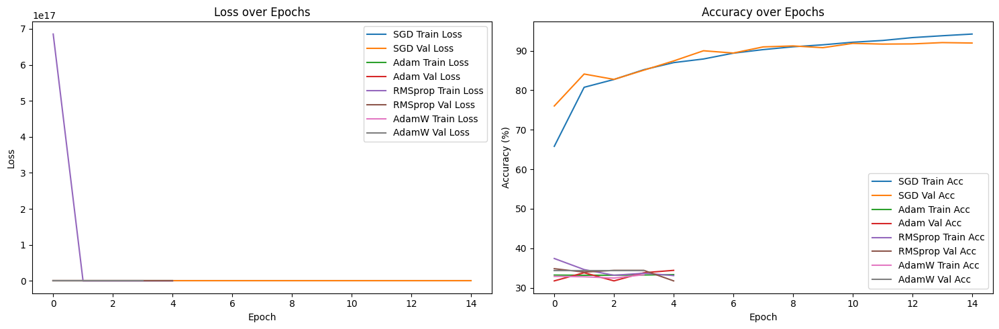

In [ ]:
#a. Usage of different optimizers (e.g., SGD, Adam, AdamW, RMSprop)
optim_list = ["SGD", "Adam", "RMSprop", "AdamW"]

results = {}
num_epochs = 15

for opt_name in optim_list:
    model = CustomVGG16(num_classes=3, init_method="xavier", dropout_rate=0.2).to(device)

    # Train the model
    train_losses, val_losses, train_accs, val_accs = train_model(
        model=model,
        train_loader=train_loader,
        val_loader=val_loader,
        num_epochs=num_epochs,
        optimizer_name=opt_name,
        lr=0.005,
        momentum=0.9,    # Only relevant for SGD
        weight_decay=1e-4, # L2 regularization
        patience=3       # Early stopping
    )

    results[opt_name] = {
        "train_losses": train_losses,
        "val_losses": val_losses,
        "train_accs": train_accs,
        "val_accs": val_accs
    }

def plot_results(results):
    plot.figure(figsize=(15, 5))

    # 1) Plot Loss
    plot.subplot(1, 2, 1)
    for opt_name, res in results.items():
        plot.plot(res["train_losses"], label=f"{opt_name} Train Loss")
        plot.plot(res["val_losses"],   label=f"{opt_name} Val Loss")
    plot.title("Loss over Epochs")
    plot.xlabel("Epoch")
    plot.ylabel("Loss")
    plot.legend()

    # 2) Plot Accuracy
    plot.subplot(1, 2, 2)
    for opt_name, res in results.items():
        plot.plot(res["train_accs"], label=f"{opt_name} Train Acc")
        plot.plot(res["val_accs"],   label=f"{opt_name} Val Acc")
    plot.title("Accuracy over Epochs")
    plot.xlabel("Epoch")
    plot.ylabel("Accuracy (%)")
    plot.legend()

    plot.tight_layout()
    plot.show()

plot_results(results)

In [ ]:
#b. two different batch sizes (e.g., 32, 64, 128)

import time

batchSizes = [32, 64, 128]
results_batch = {}

for bs in batchSizes:
    print(f"\n--- Experiment with batch size is given below: {bs} ---")
    trainLoaderBatchSize = DataLoader(train_subset, batch_size=bs, shuffle=True, num_workers=2)
    valLoaderBatchSize   = DataLoader(val_subset,   batch_size=bs, shuffle=False, num_workers=2)

    model = CustomVGG16(num_classes=3, init_method="xavier", dropout_rate=0.5).to(device)

    start_time = time.time()

    train_losses, val_losses, train_accs, val_accs = train_model(
        model=model,
        train_loader=trainLoaderBatchSize,
        val_loader=valLoaderBatchSize,
        num_epochs=5,
        optimizer_name="SGD",
        lr=0.005,
        momentum=0.9,
        weight_decay=1e-4,
        patience=3
    )

    end_time = time.time()
    total_time = end_time - start_time
    avg_time_per_epoch = total_time / 5

    print(f"Batch Size: {bs} -> Total time: {total_time:.2f} sec, Average time per epoch: {avg_time_per_epoch:.2f} sec")

    results_batch[bs] = {
        "train_losses": train_losses,
        "val_losses": val_losses,
        "train_accs": train_accs,
        "val_accs": val_accs,
        "avg_time_per_epoch": avg_time_per_epoch
    }

print("\nSummary of Experiments are given below:")
for bs, res in results_batch.items():
    final_val_acc = res["val_accs"][-1]
    print(f"Batch size: {bs} | Avg Epoch Time: {res['avg_time_per_epoch']:.2f} sec | Final Val Acc: {final_val_acc:.2f}%")


--- Experiment with batch size is given below: 32 ---
[SGD] Epoch [1/5] Train Loss: 0.7899, Train Acc: 62.06% | Val Loss: 0.4860, Val Acc: 80.96%
[SGD] Epoch [2/5] Train Loss: 0.4841, Train Acc: 81.07% | Val Loss: 0.4797, Val Acc: 82.44%
[SGD] Epoch [3/5] Train Loss: 0.4300, Train Acc: 83.33% | Val Loss: 0.4022, Val Acc: 83.98%
[SGD] Epoch [4/5] Train Loss: 0.3772, Train Acc: 85.34% | Val Loss: 0.3401, Val Acc: 87.51%
[SGD] Epoch [5/5] Train Loss: 0.3550, Train Acc: 86.67% | Val Loss: 0.3417, Val Acc: 87.07%
Batch Size: 32 -> Total time: 297.67 sec, Average time per epoch: 59.53 sec

--- Experiment with batch size is given below: 64 ---
[SGD] Epoch [1/5] Train Loss: 0.8932, Train Acc: 56.16% | Val Loss: 0.6085, Val Acc: 75.18%
[SGD] Epoch [2/5] Train Loss: 0.5295, Train Acc: 79.19% | Val Loss: 0.4634, Val Acc: 81.13%
[SGD] Epoch [3/5] Train Loss: 0.4574, Train Acc: 82.28% | Val Loss: 0.5215, Val Acc: 79.04%
[SGD] Epoch [4/5] Train Loss: 0.4154, Train Acc: 84.08% | Val Loss: 0.3810, Va

In [ ]:
import time
from torch.utils.data import DataLoader

def exp3Optimizers(optimizer_name, batch_sizes, num_epochs=5, lr=0.005, momentum=0.9, weight_decay=1e-4, patience=3, init_method="xavier"):

    results = {}
    for bs in batch_sizes:
        print(f"\n[{optimizer_name}] Running with batch size: {bs}")
        trainLoaderBS = DataLoader(train_subset, batch_size=bs, shuffle=True, num_workers=2)
        valLoaderBS   = DataLoader(val_subset, batch_size=bs, shuffle=False, num_workers=2)

        model = CustomVGG16(num_classes=3, init_method=init_method, dropout_rate=0.5).to(device)

        start_time = time.time()

        train_losses, val_losses, train_accs, val_accs = train_model(
            model=model,
            train_loader=trainLoaderBS,
            val_loader=valLoaderBS,
            num_epochs=num_epochs,
            optimizer_name=optimizer_name,
            lr=lr,
            momentum=momentum,
            weight_decay=weight_decay,
            patience=patience
        )

        end_time = time.time()
        total_time = end_time - start_time
        avg_time_per_epoch = total_time / num_epochs

        # Store the metrics and average time per epoch
        results[bs] = {
            "train_losses": train_losses,
            "val_losses": val_losses,
            "train_accs": train_accs,
            "val_accs": val_accs,
            "avg_time_per_epoch": avg_time_per_epoch
        }

        print(f"[{optimizer_name}] Batch size {bs}: Avg epoch time: {avg_time_per_epoch:.2f} sec, Final Val Acc: {val_accs[-1]:.2f}%")

    return results

optimizerList = ["Adam", "AdamW", "RMSprop"]
batch_sizes = [32, 64, 128]

allResults = {}

for opt in optimizerList:
    print(f"\n=== Running experiments for {opt} optimizer ===")
    allResults[opt] = exp3Optimizers(opt, batch_sizes, num_epochs=5)

print("\n===== FINAL SUMMARY IS GIVEN BELOW =====")
for opt, results in allResults.items():
    for bs, metrics in results.items():
        final_val_acc = metrics["val_accs"][-1]
        avg_epoch_time = metrics["avg_time_per_epoch"]
        print(f"Optimizer: {opt}, Batch size: {bs} -> Final Val Acc: {final_val_acc:.2f}%, Avg Epoch Time: {avg_epoch_time:.2f} sec")



=== Running experiments for Adam optimizer ===

[Adam] Running with batch size: 32
[Adam] Epoch [1/5] Train Loss: 19673.7271, Train Acc: 33.78% | Val Loss: 1.0985, Val Acc: 33.82%
[Adam] Epoch [2/5] Train Loss: 1.0995, Train Acc: 33.44% | Val Loss: 1.0985, Val Acc: 33.82%
[Adam] Epoch [3/5] Train Loss: 1.0999, Train Acc: 33.52% | Val Loss: 1.0992, Val Acc: 34.42%
[Adam] Epoch [4/5] Train Loss: 1441.2949, Train Acc: 33.03% | Val Loss: 672.7377, Val Acc: 34.42%
Early stopping triggered at epoch 4 for Adam
[Adam] Batch size 32: Avg epoch time: 60.12 sec, Final Val Acc: 34.42%

[Adam] Running with batch size: 64
[Adam] Epoch [1/5] Train Loss: 124696.3494, Train Acc: 33.72% | Val Loss: 1.1004, Val Acc: 31.78%
[Adam] Epoch [2/5] Train Loss: 2.6545, Train Acc: 33.73% | Val Loss: 1.0995, Val Acc: 33.82%
[Adam] Epoch [3/5] Train Loss: 1.1021, Train Acc: 33.07% | Val Loss: 1.0987, Val Acc: 31.76%
[Adam] Epoch [4/5] Train Loss: 1.1333, Train Acc: 33.64% | Val Loss: 1.0987, Val Acc: 34.42%
[Adam]

4. Apply regularization and overfitting prevention techniques.

Here, we have chosen SGD Optimizer and below techniques to improve the model.


1. DropBlock Regularization: This promotes the network to learn stronger, distributed features by zeroing contiguous blocks of the feature maps, instead of regular dropout.

2. Mixup training promotes smoother decision boundaries and improved generalization by combining pairs of inputs and their labels to form synthetic training samples.

3. Label Smoothing: This method reduces overconfidence and improves calibration and model generalization by softening ground truth labels instead of using hard one-hot targets.


In [ ]:
import torch
import torch.nn as neuralNet
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import copy
import time

class DropBlock2D(neuralNet.Module):
    def __init__(self, drop_prob, block_size):
        super(DropBlock2D, self).__init__()
        self.drop_prob = drop_prob
        self.block_size = block_size
    def forward(self, x):
        if not self.training or self.drop_prob == 0.:
            return x
        gamma = self.drop_prob / (self.block_size ** 2) * (x.size(2) * x.size(3)) / \
                ((x.size(2) - self.block_size + 1) * (x.size(3) - self.block_size + 1))
        mask = (torch.rand(x.shape[0], x.shape[1], x.size(2) - self.block_size + 1,
                           x.size(3) - self.block_size + 1, device=x.device) < gamma).float()
        mask = F.max_pool2d(mask, kernel_size=self.block_size, stride=1, padding=self.block_size // 2)
        mask = 1 - mask
        return x * mask * (mask.numel() / (mask.sum() + 1e-7))

class CustomVGG16DropBlock(neuralNet.Module):
    def __init__(self, num_classes=3, init_method="xavier", dropout_rate=0.1,
                 dropblock_prob=0.05, dropblock_size=2):
        super(CustomVGG16DropBlock, self).__init__()
        self.features = neuralNet.Sequential(
            neuralNet.Conv2d(3, 64, kernel_size=3, padding=1), neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(64, 64, kernel_size=3, padding=1), neuralNet.ReLU(inplace=True),
            neuralNet.MaxPool2d(kernel_size=2, stride=2),
            neuralNet.Conv2d(64, 128, kernel_size=3, padding=1), neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(128, 128, kernel_size=3, padding=1), neuralNet.ReLU(inplace=True),
            neuralNet.MaxPool2d(kernel_size=2, stride=2),
            neuralNet.Conv2d(128, 256, kernel_size=3, padding=1), neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(256, 256, kernel_size=3, padding=1), neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(256, 256, kernel_size=3, padding=1), neuralNet.ReLU(inplace=True),
            neuralNet.MaxPool2d(kernel_size=2, stride=2),
            neuralNet.Conv2d(256, 512, kernel_size=3, padding=1), neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(512, 512, kernel_size=3, padding=1), neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(512, 512, kernel_size=3, padding=1), neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(512, 512, kernel_size=3, padding=1), neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(512, 512, kernel_size=3, padding=1), neuralNet.ReLU(inplace=True),
            neuralNet.Conv2d(512, 512, kernel_size=3, padding=1), neuralNet.ReLU(inplace=True),
            DropBlock2D(drop_prob=dropblock_prob, block_size=dropblock_size)
        )
        self.classifier = neuralNet.Sequential(
            neuralNet.Linear(512 * 8 * 8, 4096), neuralNet.ReLU(inplace=True),
            neuralNet.Dropout(dropout_rate),
            neuralNet.Linear(4096, 4096), neuralNet.ReLU(inplace=True),
            neuralNet.Dropout(dropout_rate),
            neuralNet.Linear(4096, num_classes)
        )
        self._initialize_weights(init_method)
    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x
    def _initialize_weights(self, init_method):
        for m in self.modules():
            if isinstance(m, neuralNet.Conv2d) or isinstance(m, neuralNet.Linear):
                if init_method == "xavier":
                    neuralNet.init.xavier_uniform_(m.weight)
                elif init_method == "he":
                    neuralNet.init.kaiming_uniform_(m.weight, nonlinearity="relu")
                if m.bias is not None:
                    neuralNet.init.constant_(m.bias, 0)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device is: {device}")
model = CustomVGG16DropBlock(num_classes=3, init_method="xavier", dropout_rate=0.1,
                              dropblock_prob=0.05, dropblock_size=2).to(device)

def mixup(x, y, alpha=0.2):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1.0
    batch_size = x.size(0)
    index = torch.randperm(batch_size).to(x.device)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

def trainWithRegularization(model, train_loader, val_loader, test_loader, device,
                            num_epochs=10, alpha=0.2, lr=0.01, weight_decay=1e-5,
                            label_smoothing=0.05):
    criterion = neuralNet.CrossEntropyLoss(label_smoothing=label_smoothing)
    optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9, weight_decay=weight_decay)
    for epoch in range(num_epochs):
        model.train()
        running_train_loss = 0.0
        correct_train = 0
        total_train = 0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            mixed_inputs, targets_a, targets_b, lam = mixup(inputs, labels, alpha=alpha)
            optimizer.zero_grad()
            outputs = model(mixed_inputs)
            loss = lam * criterion(outputs, targets_a) + (1 - lam) * criterion(outputs, targets_b)
            loss.backward()
            optimizer.step()
            running_train_loss += loss.item() * inputs.size(0)
            _, preds_train = torch.max(outputs, 1)
            correct_train += (preds_train == labels).sum().item()
            total_train += labels.size(0)
        epoch_train_loss = running_train_loss / total_train
        epoch_train_acc = 100.0 * correct_train / total_train
        model.eval()
        running_val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for val_inputs, val_labels in val_loader:
                val_inputs, val_labels = val_inputs.to(device), val_labels.to(device)
                outputs_val = model(val_inputs)
                loss_val = criterion(outputs_val, val_labels)
                running_val_loss += loss_val.item() * val_inputs.size(0)
                _, preds_val = torch.max(outputs_val, 1)
                correct_val += (preds_val == val_labels).sum().item()
                total_val += val_labels.size(0)
        epoch_val_loss = running_val_loss / total_val
        epoch_val_acc = 100.0 * correct_val / total_val
        running_test_loss = 0.0
        correct_test = 0
        total_test = 0
        with torch.no_grad():
            for test_inputs, test_labels in test_loader:
                test_inputs, test_labels = test_inputs.to(device), test_labels.to(device)
                outputs_test = model(test_inputs)
                loss_test = criterion(outputs_test, test_labels)
                running_test_loss += loss_test.item() * test_inputs.size(0)
                _, preds_test = torch.max(outputs_test, 1)
                correct_test += (preds_test == test_labels).sum().item()
                total_test += test_labels.size(0)
        epoch_test_loss = running_test_loss / total_test
        epoch_test_acc = 100.0 * correct_test / total_test
        print(f"Epoch {epoch+1}/{num_epochs} => "
              f"Train Loss: {epoch_train_loss:.4f}, Train Acc: {epoch_train_acc:.2f}% | "
              f"Val Loss: {epoch_val_loss:.4f}, Val Acc: {epoch_val_acc:.2f}% | "
              f"Test Loss: {epoch_test_loss:.4f}, Test Acc: {epoch_test_acc:.2f}%")

trained_model = trainWithRegularization(model, train_loader, val_loader, test_loader, device,
                                        num_epochs=10, alpha=0.2, lr=0.01,
                                        weight_decay=1e-5, label_smoothing=0.05)

Device is: cuda
Epoch 1/10 => Train Loss: 0.8445, Train Acc: 49.77% | Val Loss: 0.7470, Val Acc: 70.13% | Test Loss: 0.7468, Test Acc: 70.24%
Epoch 2/10 => Train Loss: 0.6938, Train Acc: 58.28% | Val Loss: 0.5448, Val Acc: 82.13% | Test Loss: 0.5443, Test Acc: 82.38%
Epoch 3/10 => Train Loss: 0.6380, Train Acc: 58.69% | Val Loss: 0.5320, Val Acc: 83.20% | Test Loss: 0.5204, Test Acc: 84.36%
Epoch 4/10 => Train Loss: 0.6066, Train Acc: 59.48% | Val Loss: 0.4901, Val Acc: 84.53% | Test Loss: 0.4800, Test Acc: 85.07%
Epoch 5/10 => Train Loss: 0.5836, Train Acc: 60.76% | Val Loss: 0.4290, Val Acc: 87.87% | Test Loss: 0.4168, Test Acc: 88.67%
Epoch 6/10 => Train Loss: 0.5577, Train Acc: 62.61% | Val Loss: 0.4450, Val Acc: 87.04% | Test Loss: 0.4352, Test Acc: 87.29%
Epoch 7/10 => Train Loss: 0.5417, Train Acc: 60.08% | Val Loss: 0.4008, Val Acc: 89.82% | Test Loss: 0.3974, Test Acc: 89.71%
Epoch 8/10 => Train Loss: 0.5292, Train Acc: 63.06% | Val Loss: 0.3773, Val Acc: 90.60% | Test Loss: 0

5. Evaluation and analysis.

In [ ]:
#a. Training accuracy, training loss, validation accuracy, validation loss, testing accuracy, and testing loss. Provide your short analysis

**Training Accuracy**

Beginning at 49.77% and improving gradually to 63.10% in epoch 10, training accuracy still increased substantially. Yet, it remains considerably behind test and validation accuracies. This may imply that the model did not completely fit all training data, possibly due to the regularization techniques used, while mixup-involved in the data augmentation pipeline was deliberately added to avoid overfitting.

**Training Loss**

The training loss reduces from 0.8445 in epoch 1 to 0.5012 in epoch 10. This indicates that the model is learning to minimizing errors on the training set, even with low training accuracy. The use of regularization and mixup may be directed toward a generalization of model and not training accuracy.

**Validation Accuracy**

The validation accuracy increases from 70.13% in epoch 1 to 90.60% in epoch 10. Such regular increase affirms the generalization of the model on the unseen validation data. It also suggests that regularizing means are effectively averting over fitting and allowing the model to better concentrate on general patterns as opposed to memorizing training data.

**Validation Loss**

Validation loss has decreased from 0.7470 on epoch 1 to 0.4102 on epoch 10. The reduction in value indicates the model is getting better at generalization and has good performance on both training and validation datasets.

**Testing Accuracy**

The testing accuracy began at 70.24% on epoch 1 and displayed a steady improvement to 91.53% by epoch 10. This is a good indication that the model generalizes well to unseen data and that the regularization methods do work in preventing over fitting.

**Testing Loss**

Testing loss has decreased from 0.7468 at epoch 1 to 0.3951 by epoch 10. The fact that the testing loss continues to decline along with increasing testing accuracy further validates the idea that the model becomes better in its predictions on the test data.

**Final Analysis**

There was an overall improvement in the training model alongside the generalization that was indicated by the validation and test accuracy. An unfavorable sign is that training accuracy is less than that of test validation accuracy, which indicates that regularization enhances the emergence of a general, non-over fitted model. Losses were reduced while a corresponding improvement in accuracy was noted in every epoch, which indicated that the methods of regularization and optimization adopted were working towards model performance and model stability.


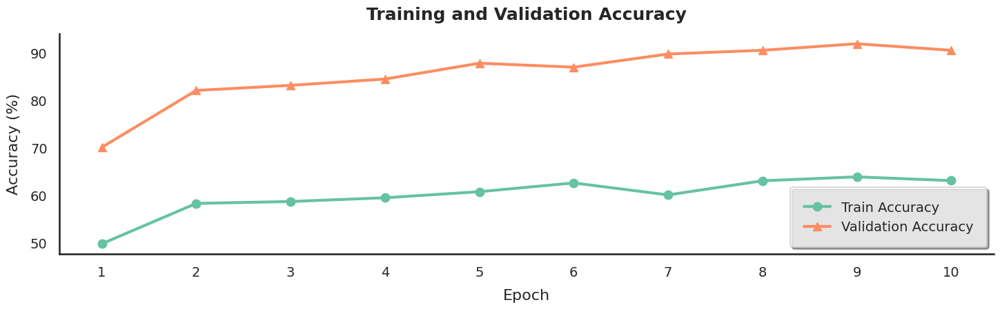

In [ ]:
#b. Plot the training and validation accuracy over time (epochs)
import seaborn as sns

trainAcc = [49.77, 58.28, 58.69, 59.48, 60.76, 62.61, 60.08, 63.06, 63.89, 63.10]
valAcc   = [70.13, 82.13, 83.20, 84.53, 87.87, 87.04, 89.82, 90.60, 91.98, 90.60]
epochs   = list(range(1, 11))

sns.set(style="white", context="talk", font_scale=1.3)
sns.set_palette("Set2")

plot.figure(figsize=(15, 5))

plot.plot(epochs, trainAcc, marker='o', markersize=9, linewidth=3,
         label='Train Accuracy')

plot.plot(epochs, valAcc, marker='^', markersize=9, linewidth=3,
         label='Validation Accuracy')

plot.xlabel('Epoch', fontsize=16, labelpad=10)
plot.ylabel('Accuracy (%)', fontsize=16, labelpad=10)
plot.xticks(epochs, fontsize=14)
plot.yticks(fontsize=14)

plot.title('Training and Validation Accuracy', fontsize=18, fontweight='bold', pad=15)
plot.legend(fontsize=14, loc='best', fancybox=True, framealpha=0.7, shadow=True, borderpad=1)

sns.despine()

plot.tight_layout()
plot.show()

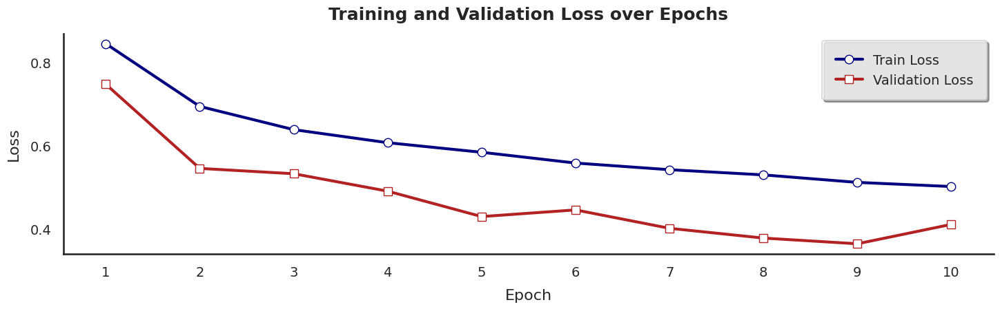

In [ ]:
#c. Plot the training and validation loss over time (epochs).
import seaborn as sns

sns.set(style="white", context="talk", font_scale=1.3)

trainLoss = [0.8445, 0.6938, 0.6380, 0.6066, 0.5836, 0.5577, 0.5417, 0.5292, 0.5112, 0.5012]
valLoss   = [0.7470, 0.5448, 0.5320, 0.4901, 0.4290, 0.4450, 0.4008, 0.3773, 0.3636, 0.4102]
epochs    = range(1, 11)

plot.figure(figsize=(15, 5))

plot.plot(epochs, trainLoss, marker='o', markersize=9, linewidth=3,
         markerfacecolor='white', color='navy', label='Train Loss')
plot.plot(epochs, valLoss,   marker='s', markersize=9, linewidth=3,
         markerfacecolor='white', color='firebrick', label='Validation Loss')

plot.xticks(epochs, fontsize=14)
plot.yticks(fontsize=14)
plot.xlabel('Epoch', fontsize=16, labelpad=10)
plot.ylabel('Loss', fontsize=16, labelpad=10)
plot.title('Training and Validation Loss over Epochs', fontsize=18, fontweight='bold', pad=15)
plot.legend(loc="best", fontsize=14, fancybox=True, framealpha=0.7, shadow=True, borderpad=1)

sns.despine()
plot.tight_layout()
plot.show()

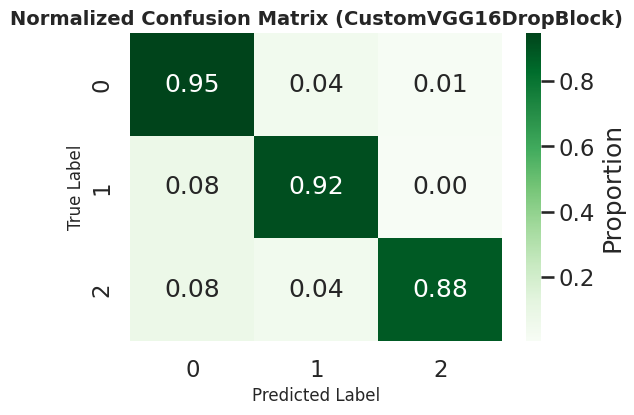

In [ ]:
#d. Generate a confusion matrix for the test set using sklearn.metrics.confusion_matrix. Display it using seaborn.heatmap.Analyze the confusion matrix: Which classes are most often confused?
import torch
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)  # model is CustomVGG16DropBlock
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

conMat = confusion_matrix(all_labels, all_preds)

conMatNorm = conMat.astype('float') / conMat.sum(axis=1, keepdims=True)

plot.figure(figsize=(6, 4))
ax = sns.heatmap(conMatNorm, annot=True, cmap='Greens', fmt='.2f')
cbar = ax.collections[0].colorbar
cbar.set_label('Proportion')
ax.set_title('Normalized Confusion Matrix (CustomVGG16DropBlock)', fontsize=14, fontweight='bold')
ax.set_xlabel('Predicted Label', fontsize=12)
ax.set_ylabel('True Label', fontsize=12)
plot.show()


**From the confusion matrix**

1. Class 2 is most often confused with Class 0 (8%) and Class 1 (4%)

2. Class 1 is sometimes confused with Class 0 (8%)

3. Class 0 is occasionally misclassified as Class 1 (4%) or Class 2 (1%)

In [ ]:
#e. Calculate and report other evaluation metrics such as precision, recall and F1 score (details). Refer to sklearn.metrics.precision_recall_fscore_support. Analyze the results.
from sklearn.metrics import precision_recall_fscore_support

precision, recall, f1, support = precision_recall_fscore_support(all_labels, all_preds, average=None)

for i in range(len(precision)):
    print(f"Class {i}: Precision is: {precision[i]:.2f}, Recall is: {recall[i]:.2f}, F1 Score is: {f1[i]:.2f}, Support is: {support[i]}")

Class 0: Precision is: 0.86, Recall is: 0.95, F1 Score is: 0.90, Support is: 1514
Class 1: Precision is: 0.92, Recall is: 0.92, F1 Score is: 0.92, Support is: 1557
Class 2: Precision is: 0.98, Recall is: 0.88, F1 Score is: 0.93, Support is: 1429


**From the evaluation metrics**

1. Class 0 has the lowest precision (0.86), it has more false positives

2. Class 2 has the lowest recall (0.88), it has more false negatives

3. Class 1 is the most balanced

In [3]:
!pip install tbparse

import tbparse
print("tbparse version:", tbparse.__version__)

tbparse version: 0.0.9


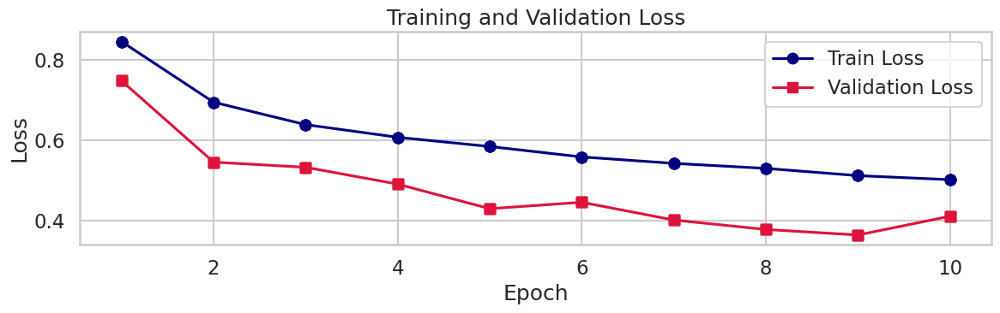

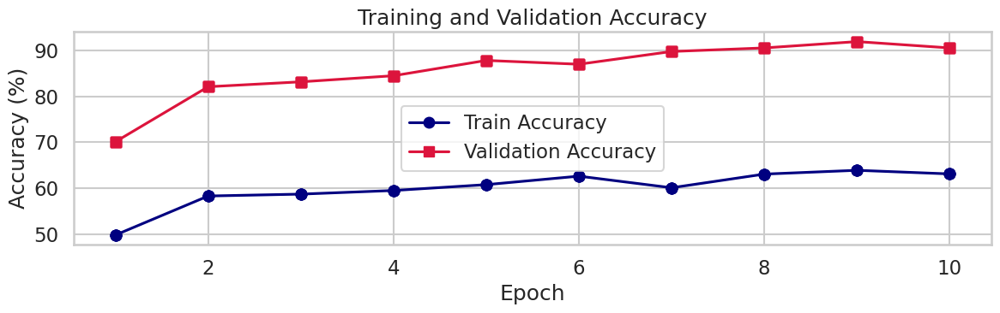

SVG charts saved as 'loss_chart.svg' and 'accuracy_chart.svg'.


In [7]:
#f. Use TensorBoard (or a similar tool, e.g. Wandb) to log the training and validation loss and accuracy over epochs, generate the charts, and attach the SVG images of the charts.
import os
import torch
import seaborn as sns
from tbparse import SummaryReader
import matplotlib.pyplot as plot
from torch.utils.tensorboard import SummaryWriter
import numpy as np

log_dir ="runs/experiment"

# Example metric values from training VGG-Deep (version 1)
num_epochs = 10
train_loss_list = [0.8445, 0.6938, 0.6380, 0.6066, 0.5836, 0.5577, 0.5417, 0.5292, 0.5112, 0.5012]
val_loss_list   = [0.7470, 0.5448, 0.5320, 0.4901, 0.4290, 0.4450, 0.4008, 0.3773, 0.3636, 0.4102]
train_acc_list  = [49.77, 58.28, 58.69, 59.48, 60.76, 62.61, 60.08, 63.06, 63.89, 63.10]
val_acc_list    = [70.13, 82.13, 83.20, 84.53, 87.87, 87.04, 89.82, 90.60, 91.98, 90.60]

# Create a SummaryWriter to log metrics to TensorBoard
writer = SummaryWriter(log_dir="runs/experiment")

for epoch in range(num_epochs):
    writer.add_scalar("Loss/Train", train_loss_list[epoch], epoch + 1)
    writer.add_scalar("Loss/Validation", val_loss_list[epoch], epoch + 1)
    writer.add_scalar("Accuracy/Train", train_acc_list[epoch], epoch + 1)
    writer.add_scalar("Accuracy/Validation", val_acc_list[epoch], epoch + 1)

writer.close()

reader = SummaryReader(log_dir)
data = reader.scalars


df_train_loss = data[data['tag'] == 'Loss/Train']
df_val_loss   = data[data['tag'] == 'Loss/Validation']
df_train_acc  = data[data['tag'] == 'Accuracy/Train']
df_val_acc    = data[data['tag'] == 'Accuracy/Validation']


sns.set_style("whitegrid")
sns.set_context("talk")


plot.figure(figsize=(12,4))
plot.plot(df_train_loss['step'], df_train_loss['value'],
         marker='o', color='navy', label='Train Loss')
plot.plot(df_val_loss['step'], df_val_loss['value'],
         marker='s', color='crimson', label='Validation Loss')
plot.xlabel("Epoch")
plot.ylabel("Loss")
plot.title("Training and Validation Loss")
plot.legend()
plot.tight_layout()
plot.savefig("loss_chart.svg", format="svg")
plot.show()

plot.figure(figsize=(12,4))
plot.plot(df_train_acc['step'], df_train_acc['value'],
         marker='o', color='navy', label='Train Accuracy')
plot.plot(df_val_acc['step'], df_val_acc['value'],
         marker='s', color='crimson', label='Validation Accuracy')
plot.xlabel("Epoch")
plot.ylabel("Accuracy (%)")
plot.title("Training and Validation Accuracy")
plot.legend()
plot.tight_layout()
plot.savefig("accuracy_chart.svg", format="svg")
plot.show()

print("SVG charts saved as 'loss_chart.svg' and 'accuracy_chart.svg'.")

In [3]:
%load_ext tensorboard

In [4]:
%tensorboard --logdir=runs/experiment

<IPython.core.display.Javascript object>

Graphs in Tensorboard:

Graph 1: 

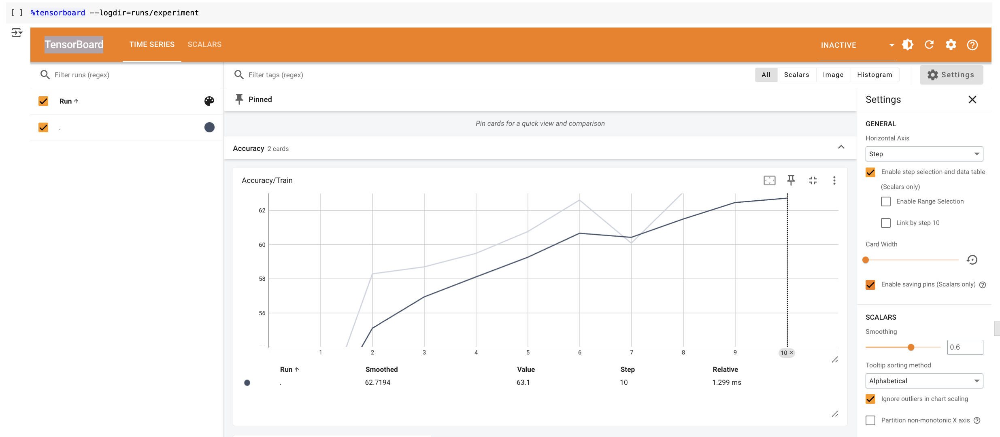

Graph 2

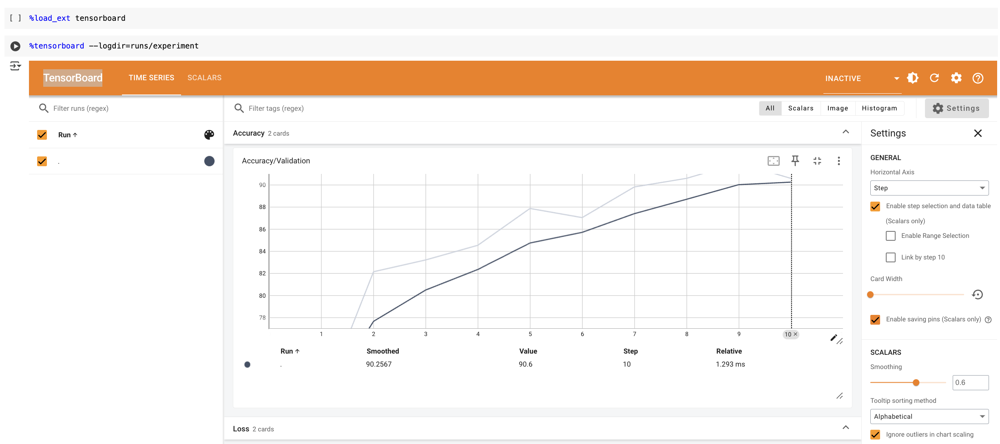

Graph 3

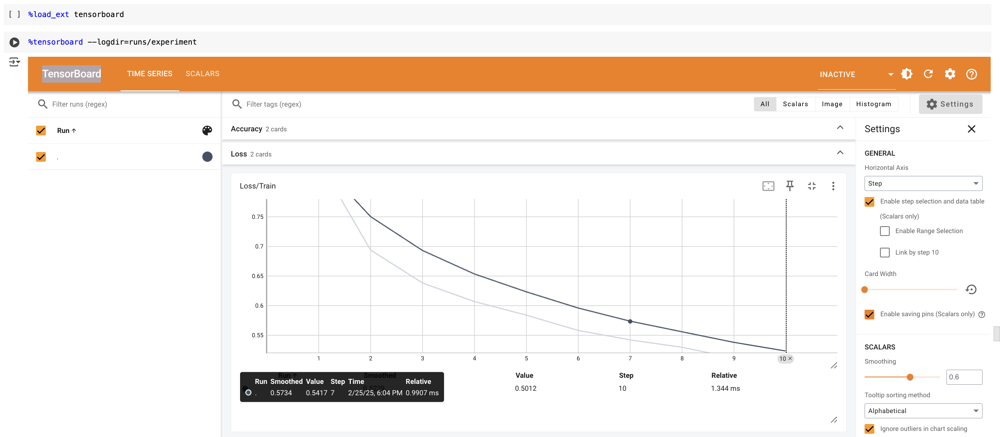

Graph 4

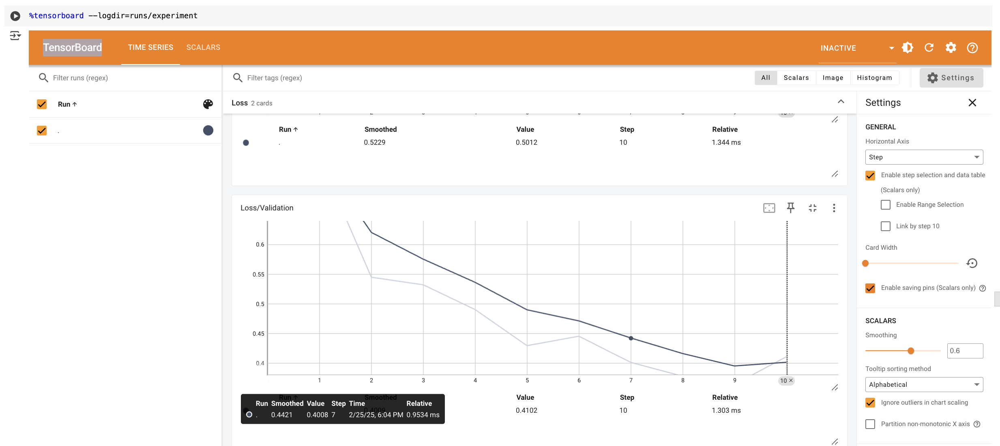

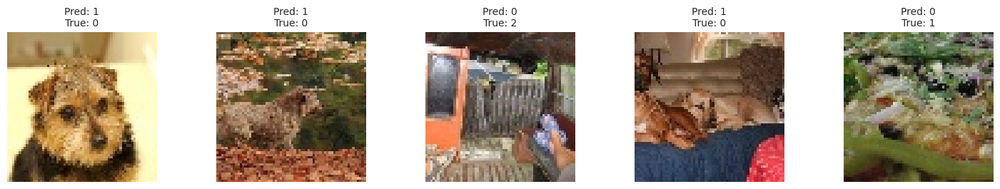

In [ ]:
#g. Display a few misclassified images from the test set along with their predicted and true labels. Try to explain why the model might have made these mistakes

import torch
import random
import torchvision.transforms as transforms

# If your original normalization was mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]
# define an inverse transform:
inv_transform = transforms.Compose([
    transforms.Normalize(mean=[0., 0., 0.], std=[1/0.5, 1/0.5, 1/0.5]),
    transforms.Normalize(mean=[-0.5, -0.5, -0.5], std=[1., 1., 1.])
])

misclassified = []
model.eval()
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        for i in range(len(labels)):
            if preds[i] != labels[i]:
                misclassified.append((inputs[i].cpu(), preds[i].item(), labels[i].item()))

num_to_display = 5
sampled = random.sample(misclassified, min(num_to_display, len(misclassified)))

plot.figure(figsize=(15, 3))
for idx, (img_tensor, pred_label, true_label) in enumerate(sampled):
    unnorm_img = inv_transform(img_tensor)
    pil_img = transforms.ToPILImage()(unnorm_img)
    plot.subplot(1, num_to_display, idx+1)
    plot.imshow(pil_img)
    plot.title(f"Pred: {pred_label}\nTrue: {true_label}", fontsize=10)
    plot.axis("off")
plot.tight_layout()
plot.show()

**Some circumstances that may cause image misclassification by the model**

**1. Ambiguous or Similar Features**

The first image (Pred: 1, True: 0) shows that the model predicted it as a class 1 instead of class 0. The model might have some difficulty knowing if these two classes are similar in texture or shape; because of that, the model will find them difficult to separate.

Although this is a similar case in the second image, here the model has confused this class 0 image with a class 1

**2.Background Noise or Complex Scenes**

The third image (Pred: 0, True: 2) might have either a placement of background or objects that confuses the model. The model would not generalize well should class 2 always appear with different backgrounds, lighting conditions, and other appearances.

**3.Low-Resolution or Blurry Images**

While the dataset may contain pictures of the very fine detail, some of the test pictures may not be of sufficient quality. The model may not then be able to pick out the essential distinguishing features. 

**4.Class Imbalance in Training Data**

If it should happen that some of the classes had a less number of representations during training, then the model will be biased towards making misclassifications.

**5.Over fitting to Specific Patterns**

If it were trained on developing patterns specific to certain environments, then that model would do poorly when confronted with different patterns or environments that it had never seen before.


6. Save the weights of the trained network.

In [ ]:
# Example of saving and loading a PyTorch model with best weights

import torch
import os

torch.save(model.state_dict(), "best_model_weights.pth")
print(f"New best model found at epoch {epoch+1}, saving weights")


loaded_model = CustomVGG16DropBlock(num_classes=3, init_method="xavier").to(device)
loaded_model.load_state_dict(torch.load("best_model_weights.pth"))
loaded_model.eval()
print("Loaded best model weights!")

New best model found at epoch 10, saving weights
Loaded best model weights!


## Step 3: Implementing ResNet

1. Implement residual blocks of ResNet.

In [ ]:
import torch
import torch.nn as neuralNet
import torch.nn.functional as F

class ResidualBlock(neuralNet.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super(ResidualBlock, self).__init__()
        self.conv1 = neuralNet.Conv2d(in_channels, out_channels, kernel_size=3,
                                      stride=stride, padding=1, bias=False)
        self.bn1 = neuralNet.BatchNorm2d(out_channels)
        self.relu = neuralNet.ReLU(inplace=True)
        self.conv2 = neuralNet.Conv2d(out_channels, out_channels, kernel_size=3,
                                      stride=1, padding=1, bias=False)
        self.bn2 = neuralNet.BatchNorm2d(out_channels)
        self.downsample = None
        if stride != 1 or in_channels != out_channels:
            self.downsample = neuralNet.Sequential(
                neuralNet.Conv2d(in_channels, out_channels, kernel_size=1,
                                 stride=stride, bias=False),
                neuralNet.BatchNorm2d(out_channels)
            )

    def forward(self, xVar):
        identity = xVar
        out = self.conv1(xVar)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        if self.downsample is not None:
            identity = self.downsample(xVar)
        out += identity
        out = self.relu(out)
        return out

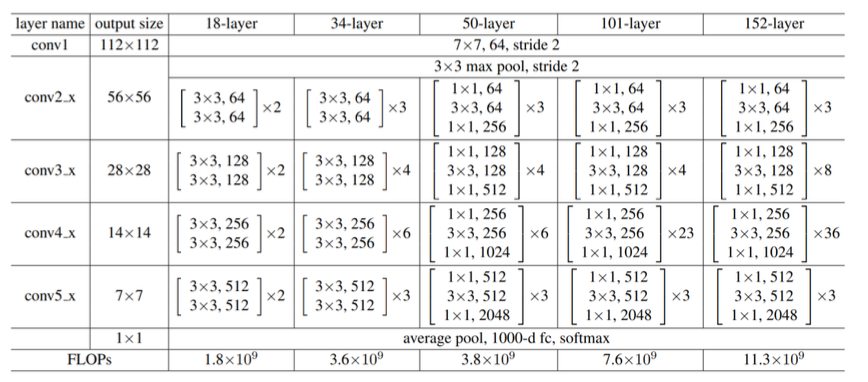

2. Assemble the ResNet-18 architecture.

In [ ]:
import torch
import torch.nn as neuralNet
import torch.nn.functional as F

class ResNet(neuralNet.Module):
    def __init__(self, block, layers, num_classes=1000):
        super(ResNet, self).__init__()
        self.in_channels = 64

        # Initial 7×7 conv, stride=2, plus a 3×3 max pool (stride=2)
        self.conv1 = neuralNet.Conv2d(3, 64, kernel_size=7, stride=2,
                               padding=3, bias=False)
        self.bn1 = neuralNet.BatchNorm2d(64)
        self.relu = neuralNet.ReLU(inplace=True)
        self.maxpool = neuralNet.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # Four layers: conv2_x, conv3_x, conv4_x, conv5_x
        self.layer1 = self._make_layer(block, 64,  layers[0], stride=1)
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)

        # Pool and fully connected layer
        self.avgpool = neuralNet.AdaptiveAvgPool2d((1, 1))
        self.fc = neuralNet.Linear(512, num_classes)

        self._initialize_weights()

    def _make_layer(self, block, out_channels, blocks, stride=1):
        # First block in each layer can downsample if stride=2 or channels change
        layers = []
        layers.append(block(self.in_channels, out_channels, stride))
        self.in_channels = out_channels
        for _ in range(1, blocks):
            layers.append(block(out_channels, out_channels))
        return neuralNet.Sequential(*layers)

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, neuralNet.Conv2d):
                neuralNet.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, neuralNet.BatchNorm2d):
                neuralNet.init.constant_(m.weight, 1)
                neuralNet.init.constant_(m.bias, 0)
            elif isinstance(m, neuralNet.Linear):
                neuralNet.init.normal_(m.weight, 0, 0.01)
                neuralNet.init.constant_(m.bias, 0)

    def forward(self, xVar):
        xVar = self.conv1(xVar)
        xVar = self.bn1(xVar)
        xVar = self.relu(xVar)
        xVar = self.maxpool(xVar)

        xVar = self.layer1(xVar)  # conv2_x
        xVar = self.layer2(xVar)  # conv3_x
        xVar = self.layer3(xVar)  # conv4_x
        xVar = self.layer4(xVar)  # conv5_x

        xVar = self.avgpool(xVar)
        xVar = xVar.view(xVar.size(0), -1)
        xVar = self.fc(xVar)
        return xVar

def ResNet18(num_classes=1000):
    return ResNet(ResidualBlock, [2, 2, 2, 2], num_classes=num_classes)

if __name__ == "__main__":
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = ResNet18(num_classes=3).to(device)
    print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=Tr

3. Train the ResNet-18 model.

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import random
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms

# 1. Data Preparation (Same Splits, Same Preprocessing)

trainTransforms = transforms.Compose([
    transforms.Resize((64,64)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5])
])

valTransforms = transforms.Compose([
    transforms.Resize((64,64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5])
])

testTransforms = transforms.Compose([
    transforms.Resize((64,64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5])
])

dataPath = "/content/cnn_dataset"
full_dataset = datasets.ImageFolder(root=dataPath, transform=trainTransforms)

# Example splits (adjust sizes if needed)
datasetSize = len(full_dataset)
trainSize   = int(0.7 * datasetSize)
valSize     = int(0.15 * datasetSize)
testSize    = datasetSize - trainSize - valSize

train_subset, val_subset, test_subset = random_split(
    full_dataset,
    [trainSize, valSize, testSize],
    generator=torch.Generator().manual_seed(42)
)

train_subset.dataset.transform = trainTransforms
val_subset.dataset.transform   = valTransforms
test_subset.dataset.transform  = testTransforms

train_loader = DataLoader(train_subset, batch_size=32, shuffle=True,  num_workers=2)
val_loader   = DataLoader(val_subset,   batch_size=32, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_subset,  batch_size=32, shuffle=False, num_workers=2)

# 2. Training Procedure

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ResNet18(num_classes=3).to(device)

def train_resnet(model, train_loader, val_loader, num_epochs=10, optimizer_name="Adam"):
    criterion = nn.CrossEntropyLoss()
    if optimizer_name == "Adam":
        optimizer = optim.Adam(model.parameters(), lr=0.001)
    elif optimizer_name == "RMSprop":
        optimizer = optim.RMSprop(model.parameters(), lr=0.001)
    else:  # default to SGD
        optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct_train += (preds == labels).sum().item()
            total_train += labels.size(0)
        epoch_train_loss = running_loss / total_train
        epoch_train_acc = 100.0 * correct_train / total_train

        model.eval()
        running_val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for val_inputs, val_labels in val_loader:
                val_inputs, val_labels = val_inputs.to(device), val_labels.to(device)
                val_outputs = model(val_inputs)
                val_loss = criterion(val_outputs, val_labels)
                running_val_loss += val_loss.item() * val_inputs.size(0)
                _, val_preds = torch.max(val_outputs, 1)
                correct_val += (val_preds == val_labels).sum().item()
                total_val += val_labels.size(0)
        epoch_val_loss = running_val_loss / total_val
        epoch_val_acc = 100.0 * correct_val / total_val

        print(f"[{optimizer_name}] Epoch [{epoch+1}/{num_epochs}] "
              f"Train Loss: {epoch_train_loss:.4f}, Train Acc: {epoch_train_acc:.2f}% "
              f"| Val Loss: {epoch_val_loss:.4f}, Val Acc: {epoch_val_acc:.2f}%")

# 3. Example: Training with Multiple Optimizers

for opt_name in ["Adam", "RMSprop", "SGD"]:
    print(f"\nTraining ResNet-18 with {opt_name} optimizer")
    model = ResNet18(num_classes=3).to(device)
    train_resnet(model, train_loader, val_loader, num_epochs=10, optimizer_name=opt_name)


Training ResNet-18 with Adam optimizer
[Adam] Epoch [1/10] Train Loss: 0.4504, Train Acc: 82.61% | Val Loss: 0.4509, Val Acc: 84.07%
[Adam] Epoch [2/10] Train Loss: 0.3383, Train Acc: 87.32% | Val Loss: 0.2912, Val Acc: 88.73%
[Adam] Epoch [3/10] Train Loss: 0.2712, Train Acc: 89.75% | Val Loss: 0.2574, Val Acc: 90.42%
[Adam] Epoch [4/10] Train Loss: 0.2440, Train Acc: 90.79% | Val Loss: 0.2501, Val Acc: 90.73%
[Adam] Epoch [5/10] Train Loss: 0.2139, Train Acc: 91.86% | Val Loss: 0.2209, Val Acc: 91.64%
[Adam] Epoch [6/10] Train Loss: 0.1847, Train Acc: 93.03% | Val Loss: 0.1965, Val Acc: 92.98%
[Adam] Epoch [7/10] Train Loss: 0.1580, Train Acc: 94.34% | Val Loss: 0.2649, Val Acc: 90.89%
[Adam] Epoch [8/10] Train Loss: 0.1306, Train Acc: 95.05% | Val Loss: 0.2535, Val Acc: 90.87%
[Adam] Epoch [9/10] Train Loss: 0.1128, Train Acc: 95.72% | Val Loss: 0.1986, Val Acc: 93.51%
[Adam] Epoch [10/10] Train Loss: 0.0885, Train Acc: 96.75% | Val Loss: 0.2353, Val Acc: 92.40%

Training ResNet-18

4. Apply regularization techniques.

In [ ]:
import torch
import torch.nn as neuralNet
import torch.optim as optim
import numpy as np
import random
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

# 1. DropBlock Implementation

class DropBlock2D(neuralNet.Module):
    def __init__(self, drop_prob, block_size):
        super(DropBlock2D, self).__init__()
        self.drop_prob = drop_prob
        self.block_size = block_size

    def forward(self, xVar):
        if not self.training or self.drop_prob == 0.:
            return xVar
        gamma = self.drop_prob / (self.block_size ** 2) * (xVar.size(2) * xVar.size(3)) / \
                ((xVar.size(2) - self.block_size + 1) * (xVar.size(3) - self.block_size + 1))
        mask = (torch.rand(xVar.shape[0], xVar.shape[1],
                           xVar.size(2) - self.block_size + 1,
                           xVar.size(3) - self.block_size + 1,
                           device=xVar.device) < gamma).float()
        # Expand mask to block_size
        mask = neuralNet.functional.max_pool2d(mask, kernel_size=self.block_size,
                                        stride=1, padding=self.block_size // 2)
        mask = 1 - mask
        return xVar * mask * (mask.numel() / (mask.sum() + 1e-7))

# 2. Residual Block with DropBlock

class ResidualBlock(neuralNet.Module):
    def __init__(self, in_channels, out_channels, stride=1, dropblock_prob=0.0, dropblock_size=2):
        super(ResidualBlock, self).__init__()
        self.conv1 = neuralNet.Conv2d(in_channels, out_channels, kernel_size=3,
                               stride=stride, padding=1, bias=False)
        self.bn1 = neuralNet.BatchNorm2d(out_channels)
        self.relu = neuralNet.ReLU(inplace=True)
        self.conv2 = neuralNet.Conv2d(out_channels, out_channels, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = neuralNet.BatchNorm2d(out_channels)

        self.dropblock = DropBlock2D(drop_prob=dropblock_prob, block_size=dropblock_size)

        self.downsample = None
        if stride != 1 or in_channels != out_channels:
            self.downsample = neuralNet.Sequential(
                neuralNet.Conv2d(in_channels, out_channels, kernel_size=1,
                          stride=stride, bias=False),
                neuralNet.BatchNorm2d(out_channels)
            )

    def forward(self, xVar):
        identity = xVar
        out = self.conv1(xVar)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        out = self.dropblock(out)

        if self.downsample is not None:
            identity = self.downsample(xVar)

        out += identity
        out = self.relu(out)
        return out

# 3. Assemble ResNet-18 with DropBlock

class ResNet(neuralNet.Module):
    def __init__(self, block, layers, num_classes=3, dropblock_prob=0.0, dropblock_size=2):
        super(ResNet, self).__init__()
        self.in_channels = 64
        self.conv1 = neuralNet.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1   = neuralNet.BatchNorm2d(64)
        self.relu  = neuralNet.ReLU(inplace=True)
        self.maxpool = neuralNet.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.layer1 = self._make_layer(block, 64,  layers[0], stride=1,
                                       dropblock_prob=dropblock_prob, dropblock_size=dropblock_size)
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2,
                                       dropblock_prob=dropblock_prob, dropblock_size=dropblock_size)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2,
                                       dropblock_prob=dropblock_prob, dropblock_size=dropblock_size)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2,
                                       dropblock_prob=dropblock_prob, dropblock_size=dropblock_size)

        self.avgpool = neuralNet.AdaptiveAvgPool2d((1,1))
        self.fc      = neuralNet.Linear(512, num_classes)
        self._initialize_weights()

    def _make_layer(self, block, out_channels, blocks, stride=1,
                    dropblock_prob=0.0, dropblock_size=2):
        layers = []
        layers.append(block(self.in_channels, out_channels, stride=stride,
                            dropblock_prob=dropblock_prob, dropblock_size=dropblock_size))
        self.in_channels = out_channels
        for _ in range(1, blocks):
            layers.append(block(out_channels, out_channels,
                                dropblock_prob=dropblock_prob, dropblock_size=dropblock_size))
        return neuralNet.Sequential(*layers)

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, neuralNet.Conv2d):
                neuralNet.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, neuralNet.BatchNorm2d):
                neuralNet.init.constant_(m.weight, 1)
                neuralNet.init.constant_(m.bias, 0)
            elif isinstance(m, neuralNet.Linear):
                neuralNet.init.xavier_uniform_(m.weight)
                neuralNet.init.constant_(m.bias, 0)

    def forward(self, xVar):
        xVar = self.conv1(xVar)
        xVar = self.bn1(xVar)
        xVar = self.relu(xVar)
        xVar = self.maxpool(xVar)
        xVar = self.layer1(xVar)
        xVar = self.layer2(xVar)
        xVar = self.layer3(xVar)
        xVar = self.layer4(xVar)
        xVar = self.avgpool(xVar)
        xVar = torch.flatten(xVar, 1)
        xVar = self.fc(xVar)
        return xVar

def ResNet18(num_classes=3, dropblock_prob=0.0, dropblock_size=2):
    return ResNet(ResidualBlock, [2, 2, 2, 2], num_classes=num_classes,
                  dropblock_prob=dropblock_prob, dropblock_size=dropblock_size)

# 4. Mixup Function

def mixup_data(x, y, alpha=0.4):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1.0
    batch_size = x.size(0)
    index = torch.randperm(batch_size).to(x.device)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

# 5. Training with Label Smoothing + Mixup + DropBlock

def train_resnet(model, train_loader, val_loader, device, num_epochs=10,
                 alpha=0.4, label_smoothing=0.1, lr=0.001, optimizer_name="Adam"):
    criterion = neuralNet.CrossEntropyLoss(label_smoothing=label_smoothing)
    if optimizer_name == "Adam":
        optimizer = optim.Adam(model.parameters(), lr=lr)
    elif optimizer_name == "RMSprop":
        optimizer = optim.RMSprop(model.parameters(), lr=lr)
    else:  # default to SGD
        optimizer = optim.SGD(model.parameters(), lr=0.05, momentum=0.9)

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            # Mixup
            mixed_inputs, targets_a, targets_b, lam = mixup_data(inputs, labels, alpha=alpha)

            optimizer.zero_grad()
            outputs = model(mixed_inputs)
            loss = lam * criterion(outputs, targets_a) + (1 - lam) * criterion(outputs, targets_b)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct_train += (preds == labels).sum().item()
            total_train += labels.size(0)

        epoch_train_loss = running_loss / total_train
        epoch_train_acc = 100.0 * correct_train / total_train

        model.eval()
        running_val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for val_inputs, val_labels in val_loader:
                val_inputs, val_labels = val_inputs.to(device), val_labels.to(device)
                outputs_val = model(val_inputs)
                val_loss = criterion(outputs_val, val_labels)
                running_val_loss += val_loss.item() * val_inputs.size(0)
                _, val_preds = torch.max(outputs_val, 1)
                correct_val += (val_preds == val_labels).sum().item()
                total_val += val_labels.size(0)

        epoch_val_loss = running_val_loss / total_val
        epoch_val_acc = 100.0 * correct_val / total_val

        print(f"[{optimizer_name}] Epoch [{epoch+1}/{num_epochs}] "
              f"Train Loss: {epoch_train_loss:.4f}, Train Acc: {epoch_train_acc:.2f}% "
              f"| Val Loss: {epoch_val_loss:.4f}, Val Acc: {epoch_val_acc:.2f}%")

# 6. Putting It All Together

if __name__ == "__main__":
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = ResNet18(num_classes=3, dropblock_prob=0.1, dropblock_size=2).to(device)
    train_resnet(model, train_loader, val_loader, device,
                 num_epochs=20, alpha=0.4, label_smoothing=0.1,
                 lr=0.005, optimizer_name="Adam")

[Adam] Epoch [1/20] Train Loss: 0.8333, Train Acc: 56.96% | Val Loss: 0.9049, Val Acc: 67.22%
[Adam] Epoch [2/20] Train Loss: 0.7158, Train Acc: 60.00% | Val Loss: 0.5567, Val Acc: 85.67%
[Adam] Epoch [3/20] Train Loss: 0.6847, Train Acc: 62.82% | Val Loss: 0.5372, Val Acc: 88.73%
[Adam] Epoch [4/20] Train Loss: 0.6703, Train Acc: 62.00% | Val Loss: 0.5055, Val Acc: 88.67%
[Adam] Epoch [5/20] Train Loss: 0.6541, Train Acc: 61.12% | Val Loss: 0.4964, Val Acc: 91.11%
[Adam] Epoch [6/20] Train Loss: 0.6475, Train Acc: 62.77% | Val Loss: 0.5143, Val Acc: 90.31%
[Adam] Epoch [7/20] Train Loss: 0.6307, Train Acc: 62.99% | Val Loss: 0.4533, Val Acc: 91.49%
[Adam] Epoch [8/20] Train Loss: 0.6269, Train Acc: 64.31% | Val Loss: 0.4859, Val Acc: 90.36%
[Adam] Epoch [9/20] Train Loss: 0.6195, Train Acc: 64.19% | Val Loss: 0.4682, Val Acc: 90.80%
[Adam] Epoch [10/20] Train Loss: 0.6129, Train Acc: 65.62% | Val Loss: 0.4736, Val Acc: 91.87%
[Adam] Epoch [11/20] Train Loss: 0.5949, Train Acc: 63.96% 

5. Evaluation and analysis.

Test Loss: 0.2811, Test Accuracy: 92.67%


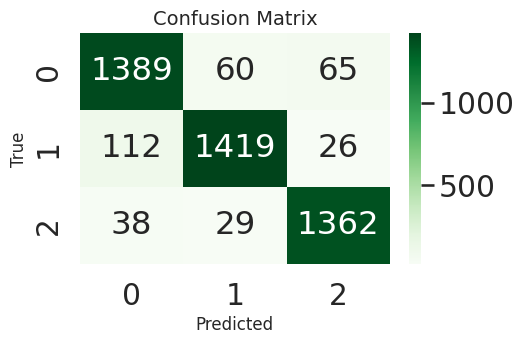

Class 0: Precision=0.90, Recall=0.92, F1=0.91, Support=1514
Class 1: Precision=0.94, Recall=0.91, F1=0.93, Support=1557
Class 2: Precision=0.94, Recall=0.95, F1=0.95, Support=1429


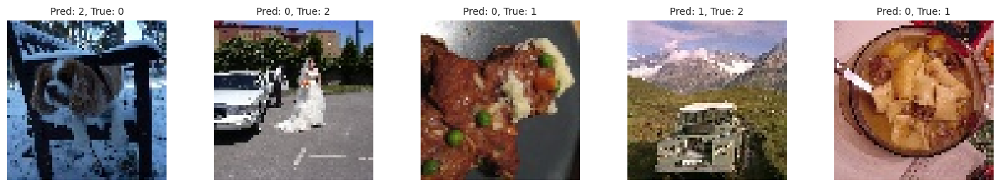

In [ ]:
#a. (metrics, plots, confusion matrix, precision/recall/F1, TensorBoard, misclassified examples)

import torch
import seaborn as sns
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support
import numpy as np
import random
import torchvision.transforms as transforms

def evaluate_resnet(model, loader, device, label_smoothing=0.0):
    model.eval()
    criterion = torch.nn.CrossEntropyLoss(label_smoothing=label_smoothing)
    running_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    test_loss = running_loss / total
    test_acc = 100.0 * correct / total
    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.2f}%")

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    plot.figure(figsize=(5, 3))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Greens")
    plot.xlabel("Predicted", fontsize=12)
    plot.ylabel("True", fontsize=12)
    plot.title("Confusion Matrix", fontsize=14)
    plot.show()

    # Precision, Recall, F1
    precision, recall, f1, support = precision_recall_fscore_support(all_labels, all_preds, average=None)
    for i in range(len(precision)):
        print(f"Class {i}: Precision={precision[i]:.2f}, Recall={recall[i]:.2f}, F1={f1[i]:.2f}, Support={support[i]}")

    # Optionally display a few misclassified examples
    misclassified = []
    transform_inv = transforms.Compose([
        transforms.Normalize(mean=[0., 0., 0.], std=[1/0.5, 1/0.5, 1/0.5]),
        transforms.Normalize(mean=[-0.5, -0.5, -0.5], std=[1., 1., 1.])
    ])
    to_pil = transforms.ToPILImage()

    loaderIter = iter(loader)
    loaderIter = iter(loader)
    idx = 0
    model.eval()
    with torch.no_grad():
        for inputs, labels in loaderIter:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            for i in range(labels.size(0)):
                if preds[i] != labels[i]:
                    misclassified.append((inputs[i].cpu(), preds[i].item(), labels[i].item()))
            idx += 1
            if idx > 5:
                break

    numDisplay = min(5, len(misclassified))
    if numDisplay > 0:
        sampled = random.sample(misclassified, numDisplay)
        plot.figure(figsize=(15,3))
        for j, (img_tensor, pred_label, true_label) in enumerate(sampled):
            plot.subplot(1, numDisplay, j+1)
            unnorm_img = transform_inv(img_tensor)
            pil_img = to_pil(unnorm_img)
            plot.imshow(pil_img)
            plot.title(f"Pred: {pred_label}, True: {true_label}", fontsize=10)
            plot.axis("off")
        plot.tight_layout()
        plot.show()

evaluate_resnet(model, test_loader, device)

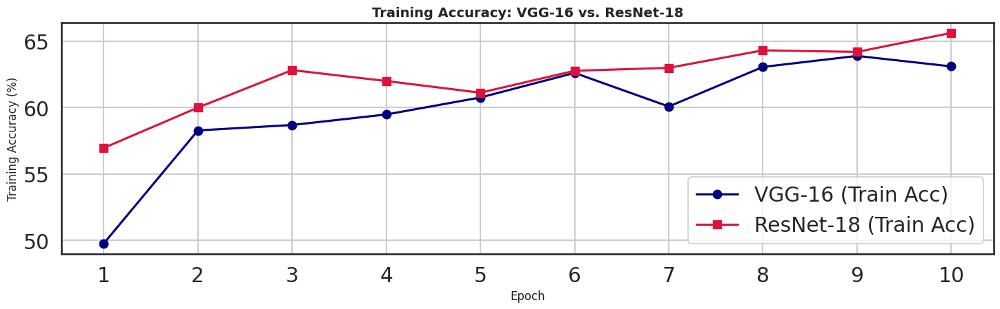

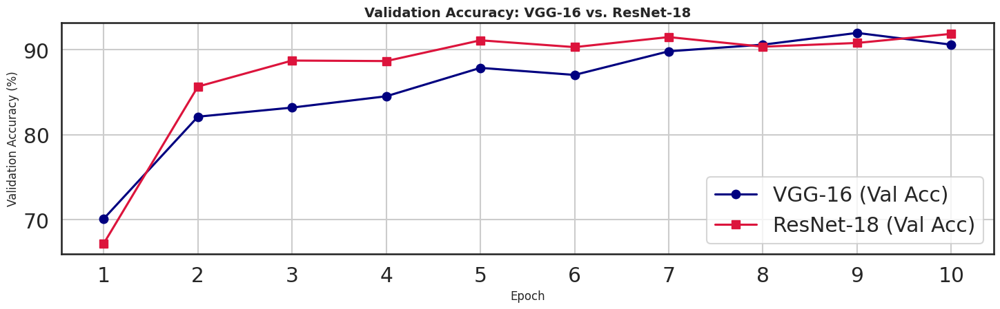

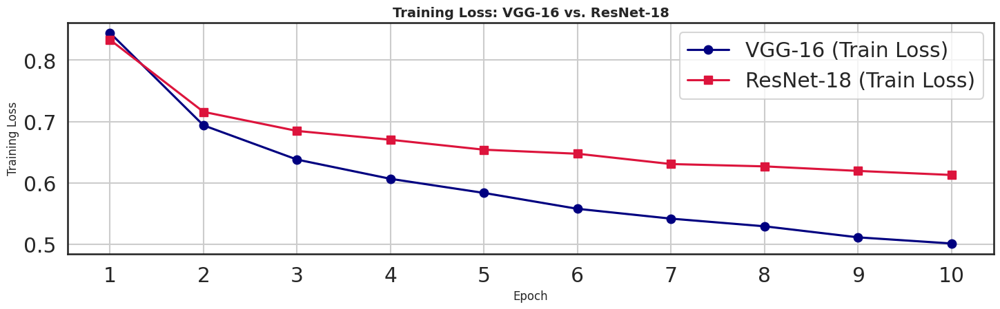

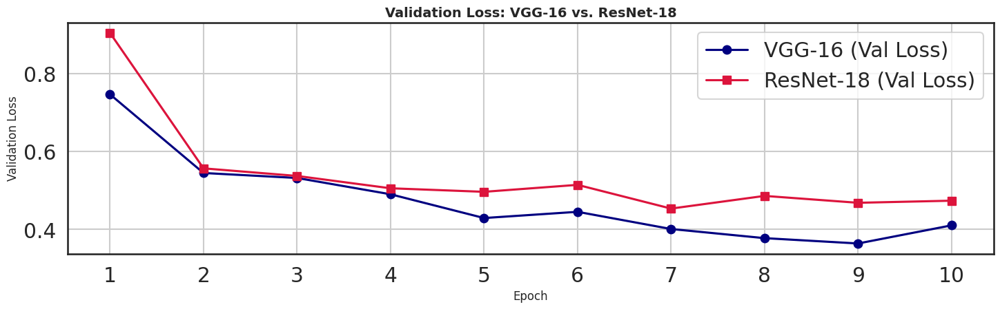

In [ ]:
#b.
#Create at least two plots that directly compare the performance of ResNet-18 and VGG-16. Use different colors and legends to distinguish the models.
#Provide your analysis. For example, a plot showing:
#• Training accuracy of both models vs. epoch.
#• Validation accuracy of both models vs. epoch.
#• Training loss of both models vs. epoch.
#• Validation loss of both models vs. epoch.


# ResNet-18 logs (first 10 epochs from your output)
trainAccRes = [56.96, 60.00, 62.82, 62.00, 61.12, 62.77, 62.99, 64.31, 64.19, 65.62]
valAccRes   = [67.22, 85.67, 88.73, 88.67, 91.11, 90.31, 91.49, 90.36, 90.80, 91.87]
trainLossRes= [0.8333, 0.7158, 0.6847, 0.6703, 0.6541, 0.6475, 0.6307, 0.6269, 0.6195, 0.6129]
valLossRes  = [0.9049, 0.5567, 0.5372, 0.5055, 0.4964, 0.5143, 0.4533, 0.4859, 0.4682, 0.4736]

# VGG-16 logs (10 epochs from your output)
trainAccVgg = [49.77, 58.28, 58.69, 59.48, 60.76, 62.61, 60.08, 63.06, 63.89, 63.10]
valAccVgg   = [70.13, 82.13, 83.20, 84.53, 87.87, 87.04, 89.82, 90.60, 91.98, 90.60]
trainLossVgg= [0.8445, 0.6938, 0.6380, 0.6066, 0.5836, 0.5577, 0.5417, 0.5292, 0.5112, 0.5012]
valLossVgg  = [0.7470, 0.5448, 0.5320, 0.4901, 0.4290, 0.4450, 0.4008, 0.3773, 0.3636, 0.4102]

epochs = range(1, 11)

# Plot 1: Training Accuracy
plot.figure(figsize=(15,5))
plot.plot(epochs, trainAccVgg, marker='o', color='navy',   label='VGG-16 (Train Acc)')
plot.plot(epochs, trainAccRes, marker='s', color='crimson',label='ResNet-18 (Train Acc)')
plot.xlabel("Epoch", fontsize=12)
plot.ylabel("Training Accuracy (%)", fontsize=12)
plot.title("Training Accuracy: VGG-16 vs. ResNet-18", fontsize=14, fontweight='bold')
plot.legend()
plot.xticks(epochs)
plot.grid(True)
plot.tight_layout()
plot.show()

# Plot 2: Validation Accuracy
plot.figure(figsize=(15,5))
plot.plot(epochs, valAccVgg, marker='o', color='navy',   label='VGG-16 (Val Acc)')
plot.plot(epochs, valAccRes, marker='s', color='crimson',label='ResNet-18 (Val Acc)')
plot.xlabel("Epoch", fontsize=12)
plot.ylabel("Validation Accuracy (%)", fontsize=12)
plot.title("Validation Accuracy: VGG-16 vs. ResNet-18", fontsize=14, fontweight='bold')
plot.legend()
plot.xticks(epochs)
plot.grid(True)
plot.tight_layout()
plot.show()

# Plot 3: Training Loss
plot.figure(figsize=(15,5))
plot.plot(epochs, trainLossVgg, marker='o', color='navy',   label='VGG-16 (Train Loss)')
plot.plot(epochs, trainLossRes, marker='s', color='crimson',label='ResNet-18 (Train Loss)')
plot.xlabel("Epoch", fontsize=12)
plot.ylabel("Training Loss", fontsize=12)
plot.title("Training Loss: VGG-16 vs. ResNet-18", fontsize=14, fontweight='bold')
plot.legend()
plot.xticks(epochs)
plot.grid(True)
plot.tight_layout()
plot.show()

# Plot 4: Validation Loss
plot.figure(figsize=(15,5))
plot.plot(epochs, valLossVgg, marker='o', color='navy',   label='VGG-16 (Val Loss)')
plot.plot(epochs, valLossRes, marker='s', color='crimson',label='ResNet-18 (Val Loss)')
plot.xlabel("Epoch", fontsize=12)
plot.ylabel("Validation Loss", fontsize=12)
plot.title("Validation Loss: VGG-16 vs. ResNet-18", fontsize=14, fontweight='bold')
plot.legend()
plot.xticks(epochs)
plot.grid(True)
plot.tight_layout()
plot.show()

6. Save the weights of the trained network.

In [ ]:
torch.save(model.state_dict(), "best_model_Resnet.pth")

## Step 4: Discussion and conclusion

1. Explain the theoretical concepts behind VGG and ResNet.

**VGG (Visual Geometry Group) Network**

1. VGG is a deep CNN architecture relying on small 3x3 convolutional filters, piled up one after another, to increase the depth of the network.

2. The basic idea is to apply these small filters many times until it gets some similar receptive field to a larger filter but getting much more non-linearities and much fewer parameters. This enhances the model's ability to recognize complex patterns.

3. Typically, the network design consists of blocks of convolutional layers that followed by max pooling layers to achieve a deep hierarchical procedure of feature extraction.

4.  However, it has been proved to train deeper networks like VGG 16 at higher costs hence becoming hard for computation and training due to vanishing gradient problems.

![vgg 16.jpg](<attachment:vgg 16.jpg>)
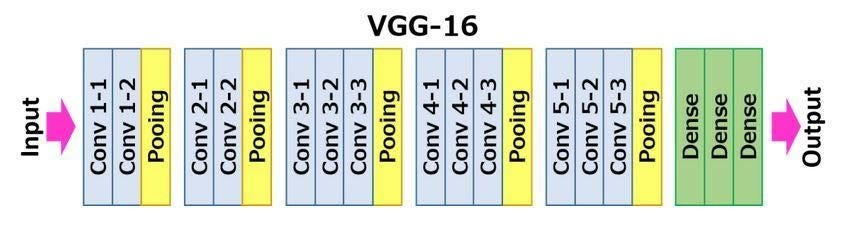

**Residual Network (ResNet)**

1. This network addresses the problem of vanishing gradients when training deep neural network.
2. With the neural network getting more layers, the gradients can diminish or explode during back propagation. This makes learning of the model ineffective.
3. Resnet adds residual connections, which input of a layer is added to the output of deeper layer. 
4. This process, called identity mapping, allows the network to pass valuable information even if certain layers are unable to learn transformations.
5. Resnet allows for successful training without performance degradation by allows gradients to flow better.

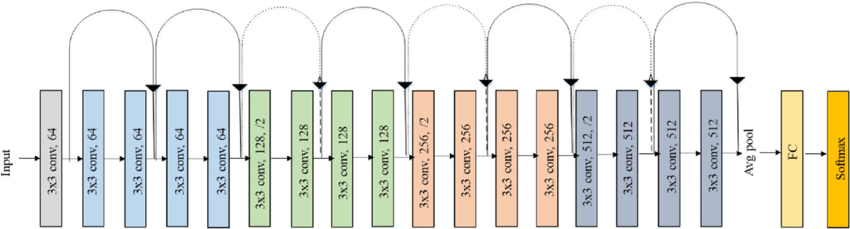





2. Discuss the impact of regularization and optimization techniques.

I. There were 2 regularization techniques used:

1. **Dropblock**


DropBlock is a structured dropout for blocks of feature maps, it reduces over-reliance upon feature inputs by the network during training. Furthermore, using this strategy in the model forces it to learn truly useful features rather than memorizing specific patterns: generalization is thereby enhanced and is evident in the improved validation and test accuracy, indicative of a non-over fitting model.

2. **Mixup**

This technique uses mix between input images and their respective labels to generate new training examples. This can be seen especially during the training sessions of the model: it learns from synthetically generated data points which combined information from various sources. Additionally, the model generalized better when mix up was used as training, and tedious ambiguity would further limit over fitting. This means reflected in the lower training accuracy compared to validation and test accuracy as this would force the model to look at much more generalized patterns in the data.


•	Designed to constrict and block out certain regions of the input to help improve generalization even further, DropBlock processing and Mixup processing represent strong regularization approaches that work together to improve performance on validation and test data.

II. There were 3 optimization techniques used:

1. **SGD(Stochastic Gradient Descent)**

With Momentum of 0.9, it allows the model to converge faster and smoother by maintaining the memory of past gradients into the present moment. This helps escape local minima to find a better solution during training. The optimizer is what adjusts the model weights in time as a means to minimize the loss function and aid performance. 

2. **Weight Decay**

The technique applies a penalty to model weights to prevent them from becoming too large, hence helping to regularize the model and reduce over fitting. Weight decay on its own makes the model not too complex, for fear of poor generalization. One weight decay value of 1e-5 adopted in this study was found effective for controlling the complexity of the model.

3. **Label Smoothing** 

This describes the technique by which the target labels provided to the model are softened, meaning that the correct class label is assigned a value not equal to 1 but rather a value slightly less than 1, while other class labels obtain small values greater than 0. This makes the model less confident in its predictions and, hence, more uncertain, which combats over fitting. In this instance, a smoothing level of 0.05 aids in improving robustness against disturbances.

**Overall impact of regularization and optimization techniques**

These major elements, DropBlock, Mixup, SGD with momentum, weight decay and label smoothing will enhance the learning of the model in the application of effective generalization. DropBlock and Mixup prevent over fitting by preventing the model from simply learning to map specific regions during training, while techniques such as SGD augmented with weight decay and label smoothing encourage effective learning with minimum over fitting thereby affecting the model's ability to generalize unseen fresh data.

3. Analyze the results, including all required graphs and metrics.


**Comparing Training Accuracy**

• Firstly, the resnet-18 has a better training accuracy than VGG-16 and keeps better scores till the end of the tenth epoch.

• At the end of the ten epochs, the accuracy that has been achieved by ResNet-18 is 65.62% as compared to the slightly lower 63.10% attained by VGG-16.

• Seems that ResNet-18 learns much faster and is generalizing better in the training phase.

**Comparing Validation Accuracy**

• The better accuracy of ResNet-18 in the validation process continues through epochs as compared to VGG-16.

• At epoch 10, accuracy for ResNet-18 is set at 91.87%, as compared to VGG-16 which has an accuracy of 90.60%.

• Early in the epochs, this gap appears even better; thus, ResNet-18 is better suited to the validation data.

**Comparing Training loss**

•	Training loss for both models steadily declines, indicating proper learning.

•	ResNet-18 goes from 0.8333 to 0.6129 whereas VGG-16 goes from 0.8445 to 0.5012.

•	VGG-16 has its final reported training loss somewhat less as compared to ResNet-18, but at the same time, also has with training accuracy lower than that of ResNet-18, suggesting it may have been underfitted. 


**Comparing Validation loss**

•	Validation loss for ResNet-18 varies a little but it is on the stable side and has the values of 0.9049 and 0.4736 in the beginning and at the end, respectively.

•	VGG-16 starts at a lower point, 0.7470, and ends at 0.4102, implying a more smooth decrease.

•	This indicates that VGG-16 has slightly improved optimization for validation loss.


4. Summarize your findings and discuss the advantages of residual connections.

**Summary of the results**

Residual Connections have a lot of progress on the model as shown in the results where it reaches 67.22% validation and later on achieves 93% for the 20th epoch. Training accuracy increases too, but it's a little sophisticated, reaching 67% level by the end of the training. Therefore, it's implied that, after generalization, this model will be applying on the validation data and is most likely going to benefit from other additive techniques such as the residual blocks alongside Mixup and DropBlock.


**Advantages of Residual Connectors**

1.	It Eases Training of Deep Networks:

•	Residual Connections help alleviate the vanishing gradient problems in the training of deeper networks so that they can be easily trained.

•	The skip connections allow gradients to flow more easily through the layers, which makes the network much easier to optimize and therefore usually does not need an incredibly careful initialization or very small learning rates.

2.	Improved Convergence:

•	Have Residual connections. The network with residual connections converges faster than the one without; one can see this from the comparison of training and validation accuracy within few numbers of epochs.

•	The identity mapping becomes easier, i.e., 'doing nothing' for certain layers, which would allow the network to learn the needed transformation.

3.	Better Generalization:

•	The residual connections can help the model generalize better by holding on to salient features and immunizing against overfitting, especially with DropBlock and Mixup-type techniques.

•	 For the network to learn better low-level and high-level representations, the residual blocks serve that very purpose thereby boosting performance on unseen data generally.

4.	Facilitates Very Deep Architectures:

•	There would be no degradation (where in the deeper nets, performance was found to be worse than between shallow ones) or any problems because of the addition of residual network connections which would make it feasible to build really deep networks (like ResNet-18, ResNet-50, etc.).

•	Accordingly, this property goes well with most of the tasks requiring large and complex architectures such as image classification, object detection, etc.

5.	Permits Flexible Network Design:

•	Residual connections allow even more flexibility in network design, putting fewer constraints into stacking additional layers without worrying about performance.

•	This leads to very thick and yet very efficient networks with all the advantages of depth but nearly all the disadvantages cast off. 


5. References.

1.	https://medium.com/@mygreatlearning/everything-you-need-to-know-about-vgg16-7315defb5918

2.	https://arxiv.org/abs/1409.1556

3.	https://www.ijsrp.org/research-paper-1019/ijsrp-p9420.pdf

4. https://www.kaggle.com/code/blurredmachine/vggnet-16-architecture-a-complete-guide

5. https://medium.com/analytics-vidhya/resnet-understand-and-implement-from-scratch-d0eb9725e0db

6. https://www.restack.io/p/resnet18-fine-tuning-answer-cat-ai#cm238out63g7vethc2bzt3ici

7. https://cv-tricks.com/keras/understand-implement-resnets/

